In [ ]:
#!pip install scipy==1.11.4
!pip install dalex
#!pip install scikit-plot
!pip install shap
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 10.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for dalex: filename=dalex-1.7.1-py3-none-any.whl size=1042797 sha256=aa6c3cfcce2ca4bce6a6ca159279cea3cc8fe9bf37f8017d66aae46cfbb603a4
  Stored in directory: /root/.cache/pip/wheels/fe/c2/41/63e006b3312a4e17299bed5f83d985dea872368f9ab16bb20f
Successfully built dalex
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=a84ef0cf3dc20a96473b0767ddd31876e37c1eb2fc94da39fbdd560f51c1b9b6
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split
import sklearn.metrics as metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from xgboost import XGBClassifier

import dalex as dx

#import scikitplot as skplt

import shap

from lime.lime_tabular import LimeTabularExplainer

# GITHUB

# Load Data

Acces the data from https://www.kaggle.com/datasets/sjleshrac/airlines-customer-satisfaction

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd "/content/drive/MyDrive/DS DIBIMBING/Dataset"

Mounted at /content/drive
/content/drive/MyDrive/DS DIBIMBING/Dataset


In [ ]:
pd.set_option("display.max_columns", None)
df = pd.read_csv('train_passenger_satisfaction.csv')
#test = pd.read_csv('test_passenger_satisfaction.csv')

In [ ]:
df.head()

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,satisfied


In [ ]:
df.shape

(103904, 25)

## Data understanding

- Gender: Gender of the passengers (Female, Male)

- Customer Type: The customer type (Loyal customer, disloyal customer)

- Age: The actual age of the passengers

- Type of Travel: Purpose of the flight of the passengers (Personal Travel, Business Travel)

- Class: Travel class in the plane of the passengers (Business, Eco, Eco Plus)

- Flight distance: The flight distance of this journey

- Inflight wifi service: Satisfaction level of the inflight wifi service (0:Not Applicable;1-5)

- Departure/Arrival time convenient: Satisfaction level of Departure/Arrival time convenient

- Ease of Online booking: Satisfaction level of online booking

- Gate location: Satisfaction level of Gate location

- Food and drink: Satisfaction level of Food and drink

- Online boarding: Satisfaction level of online boarding

- Seat comfort: Satisfaction level of Seat comfort

- Inflight entertainment: Satisfaction level of inflight entertainment

- On-board service: Satisfaction level of On-board service

- Leg room service: Satisfaction level of Leg room service

- Baggage handling: Satisfaction level of baggage handling

- Check-in service: Satisfaction level of Check-in service

- Inflight service: Satisfaction level of inflight service

- Cleanliness: Satisfaction level of Cleanliness

- Departure Delay in Minutes: Minutes delayed when departure

- Arrival Delay in Minutes: Minutes delayed when Arrival

- Satisfaction: Airline satisfaction level(Satisfaction, neutral or dissatisfaction)

## Data inspection

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 25 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Unnamed: 0                         103904 non-null  int64  
 1   id                                 103904 non-null  int64  
 2   Gender                             103904 non-null  object 
 3   Customer Type                      103904 non-null  object 
 4   Age                                103904 non-null  int64  
 5   Type of Travel                     103904 non-null  object 
 6   Class                              103904 non-null  object 
 7   Flight Distance                    103904 non-null  int64  
 8   Inflight wifi service              103904 non-null  int64  
 9   Departure/Arrival time convenient  103904 non-null  int64  
 10  Ease of Online booking             103904 non-null  int64  
 11  Gate location                      1039

* No missing value on dataset

In [ ]:
df.duplicated().sum()

0

* No duplicated dat was found on dataset

# Simple EDA

In [ ]:
df.columns

Index(['Unnamed: 0', 'id', 'Gender', 'Customer Type', 'Age', 'Type of Travel',
       'Class', 'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes',
       'satisfaction'],
      dtype='object')

## Statictical Descriptive

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,103904.0,51951.500000,29994.645522,0.0,25975.75,51951.5,77927.25,103903.0
id,103904.0,64924.210502,37463.812252,1.0,32533.75,64856.5,97368.25,129880.0
Age,103904.0,39.379706,15.114964,7.0,27.00,40.0,51.00,85.0
Flight Distance,103904.0,1189.448375,997.147281,31.0,414.00,843.0,1743.00,4983.0
Inflight wifi service,103904.0,2.729683,1.327829,0.0,2.00,3.0,4.00,5.0
Departure/Arrival time convenient,103904.0,3.060296,1.525075,0.0,2.00,3.0,4.00,5.0
Ease of Online booking,103904.0,2.756901,1.398929,0.0,2.00,3.0,4.00,5.0
Gate location,103904.0,2.976883,1.277621,0.0,2.00,3.0,4.00,5.0
Food and drink,103904.0,3.202129,1.329533,0.0,2.00,3.0,4.00,5.0
Online boarding,103904.0,3.250375,1.349509,0.0,2.00,3.0,4.00,5.0


Remove `Unnamed: 0` and `id`

In [ ]:
df = df.drop(['Unnamed: 0', 'id'], axis = 1)

Key point:
- `Inflight wifi service` until `Cleanliness` type daya categorical ordinal, we keep those as numeric
- `Flight Distance`, `Deparature Delay in Minutes` and `Arrival Delay in Minutes`type cate coninous numeric
- `Age` type data ordinal category, ke keep it as numeric

In [ ]:
df.describe(include='object').T

,count,unique,top,freq
Gender,103904,2,Female,52727
Customer Type,103904,2,Loyal Customer,84923
Type of Travel,103904,2,Business travel,71655
Class,103904,3,Business,49665
satisfaction,103904,2,neutral or dissatisfied,58879


Key points:
- all of the categorical column (object) have a binary class except `Class`

## Univariate Analysis

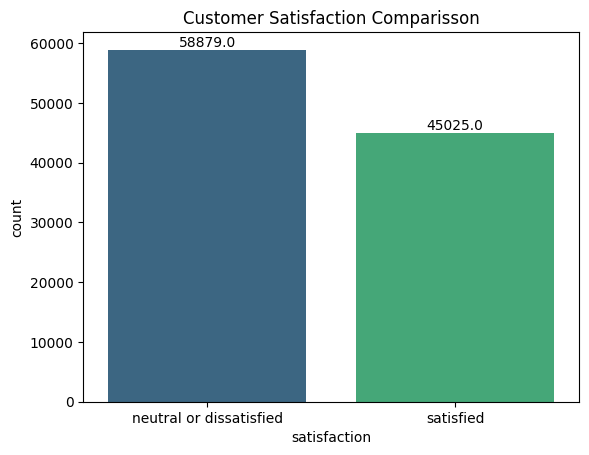

In [ ]:
ax = sns.countplot(x='satisfaction', data=df, palette='viridis')
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')
plt.title('Customer Satisfaction Comparisson')
plt.show()

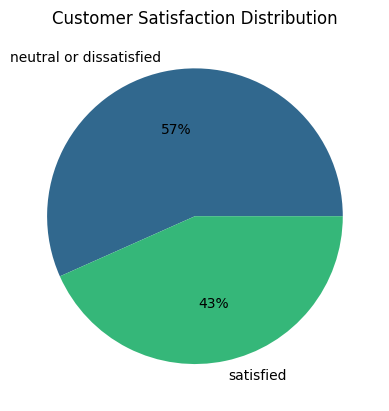

In [ ]:
satisfaction_counts = df['satisfaction'].value_counts()
colors = sns.color_palette('viridis', len(satisfaction_counts))

plt.pie(satisfaction_counts, labels=satisfaction_counts.index, autopct='%.0f%%', colors=colors)

plt.title('Customer Satisfaction Distribution')
plt.show()

In [ ]:
num = df.select_dtypes(include = 'number').columns
cat = df.select_dtypes(include = 'object').columns

In [ ]:
len(num)

18

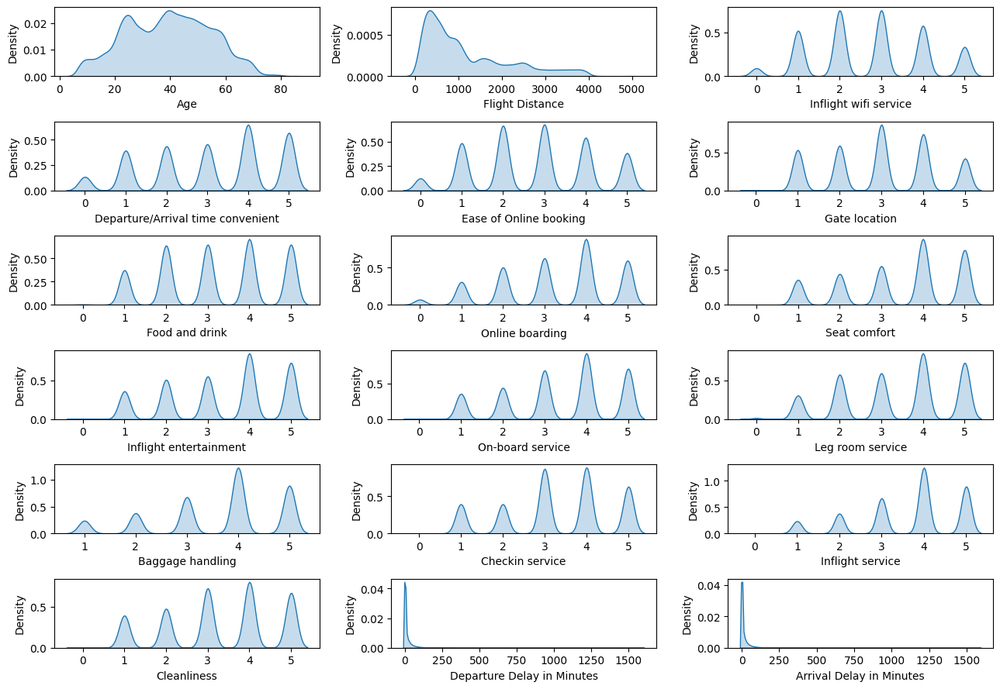

In [ ]:
plt.figure(figsize=(13,9))
for i in range(0, len(num)):
    plt.subplot(6,3, i+1)
    sns.kdeplot(data=df, x=df[num[i]], fill='True')
    plt.tight_layout()

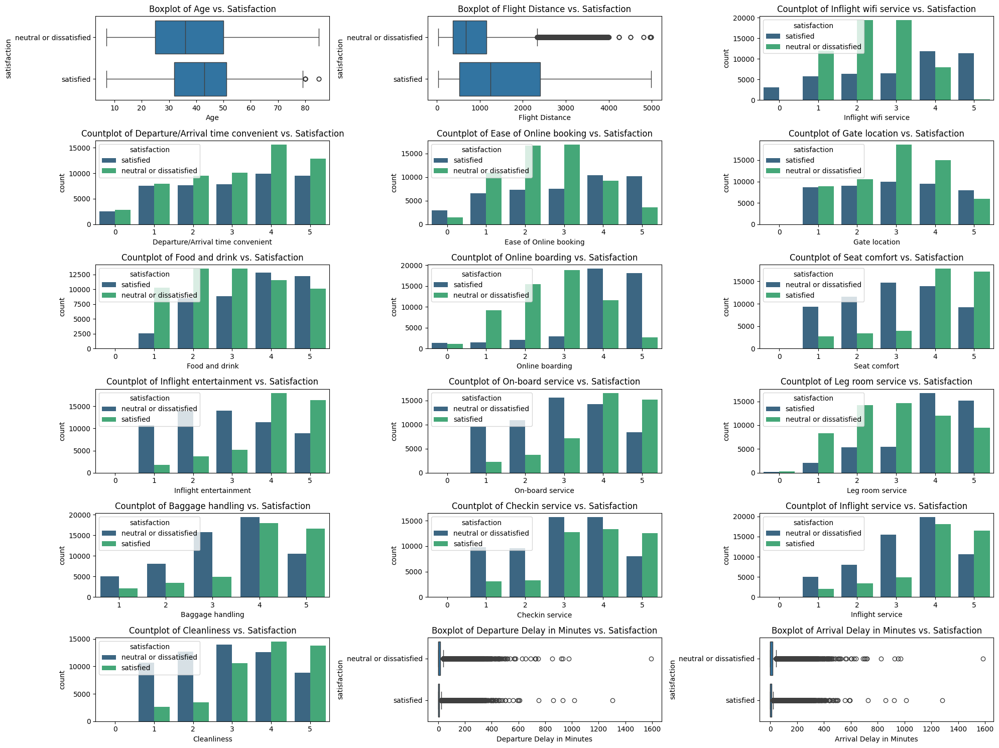

In [ ]:
plt.figure(figsize=(20, 15))

for i in range(0, len(num)):
    plt.subplot(6, 3, i + 1)

    if df[num[i]].nunique() < 6 or df[num[i]].nunique() < 7:
        sns.countplot(x=df[num[i]], hue='satisfaction', data=df,palette='viridis')
        plt.title(f'Countplot of {num[i]} vs. Satisfaction')
        plt.tight_layout()
    else:
        sns.boxplot(x=df[num[i]], y='satisfaction', data=df)
        plt.title(f'Boxplot of {num[i]} vs. Satisfaction')
        plt.tight_layout()

plt.show()

- `inflight wifi services`, `Ease of Online booking`, `seat comfort`, `inflight entertainment`, `On board services`, `baggage handling`, `inflight service` dapat menjadi faktor yang kuat yang menentukan kepuasan pelanggan

## Multi Variate Analysis

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5]),
 [Text(0.5, 0, 'Age'),
  Text(1.5, 0, 'Flight Distance'),
  Text(2.5, 0, 'Inflight wifi service'),
  Text(3.5, 0, 'Departure/Arrival time convenient'),
  Text(4.5, 0, 'Ease of Online booking'),
  Text(5.5, 0, 'Gate location'),
  Text(6.5, 0, 'Food and drink'),
  Text(7.5, 0, 'Online boarding'),
  Text(8.5, 0, 'Seat comfort'),
  Text(9.5, 0, 'Inflight entertainment'),
  Text(10.5, 0, 'On-board service'),
  Text(11.5, 0, 'Leg room service'),
  Text(12.5, 0, 'Baggage handling'),
  Text(13.5, 0, 'Checkin service'),
  Text(14.5, 0, 'Inflight service'),
  Text(15.5, 0, 'Cleanliness'),
  Text(16.5, 0, 'Departure Delay in Minutes'),
  Text(17.5, 0, 'Arrival Delay in Minutes')])

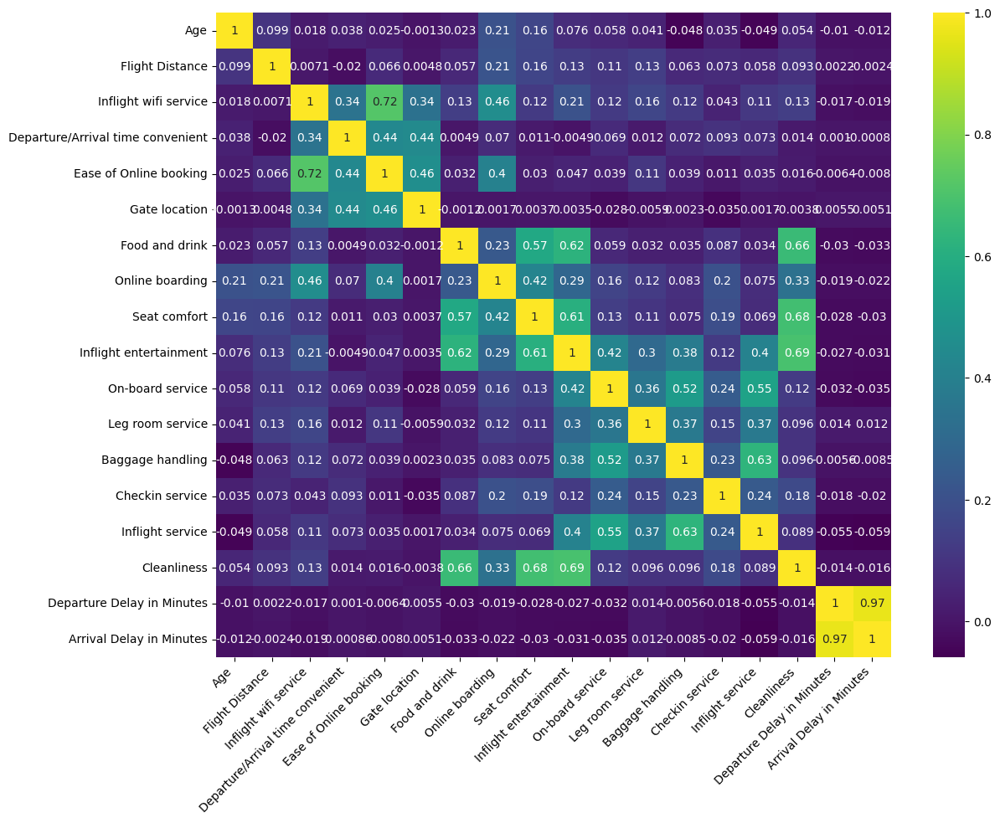

In [ ]:
plt.figure(figsize=(13,10))
corr = df[num].corr()
sns.heatmap(corr, annot = True, cmap='viridis')
plt.xticks(rotation=45, ha='right')

Key points:
- `Deparature delay in Minutes` and `arrival Delay in Monited` was hightly corelated
- `Ease of Online Booking` has high corelated with `Inflight wifi Services`

## Outliers

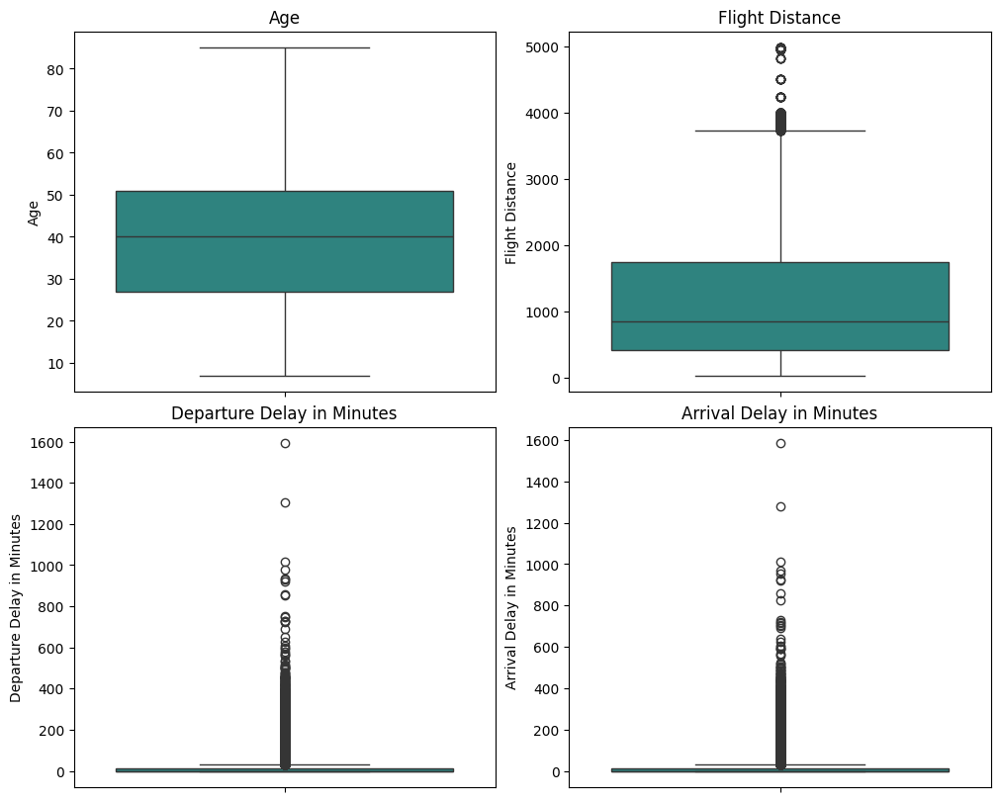

In [ ]:
fig, axes = plt.subplots(2, 2, sharex=False, sharey=False, figsize=(10, 8), constrained_layout=True)
col_index = 0
continu = df[['Age', 'Flight Distance', 'Departure Delay in Minutes', 'Arrival Delay in Minutes']].columns

for i in range(axes.shape[0]):
    for j in range(axes.shape[1]):
        sns.boxplot(ax=axes[i, j], y=df[continu[col_index]], palette='viridis')
        axes[i, j].set_title(continu[col_index])
        col_index += 1

Key points:
- `Deparature Delay in Minutes` and `Arrival Delay in Minutes`
have quite a lot of outliers

## Data Summary

In [ ]:
list = []

for col in df.columns:
    list.append([col, df[col].dtype, df[col].isna().sum(), 100*df[col].isna().sum()/len(df[col]), df[col].nunique()])
df_summary = pd.DataFrame(data=list, columns=['feature', 'data_type', 'null_num','%null','nunique'])
with pd.option_context('display.max_rows', None):
    display(df_summary)

,feature,data_type,null_num,%null,nunique
0,Gender,object,0,0.000000,2
1,Customer Type,object,0,0.000000,2
2,Age,int64,0,0.000000,75
3,Type of Travel,object,0,0.000000,2
4,Class,object,0,0.000000,3
5,Flight Distance,int64,0,0.000000,3802
6,Inflight wifi service,int64,0,0.000000,6
7,Departure/Arrival time convenient,int64,0,0.000000,6
8,Ease of Online booking,int64,0,0.000000,6
9,Gate location,int64,0,0.000000,6


Key points:
- missing value on `Arrival Delay in Minutes`

In [ ]:
df.duplicated().sum()

0

# Split train, val, test

In [ ]:
from sklearn.model_selection import train_test_split


X = df.drop('satisfaction', axis = 1)
y = df['satisfaction']
y = y.map({'neutral or dissatisfied': 0, 'satisfied': 1})

X_pretrain, X_test, y_pretrain, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)
X_train, X_val, y_train, y_val = train_test_split(X_pretrain, y_pretrain, test_size = 0.3, random_state = 42)

train_new = pd.concat([X_train,y_train], axis  = 1)


In [ ]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 31172 entries, 80638 to 24931
Data columns (total 22 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Gender                             31172 non-null  object 
 1   Customer Type                      31172 non-null  object 
 2   Age                                31172 non-null  int64  
 3   Type of Travel                     31172 non-null  object 
 4   Class                              31172 non-null  object 
 5   Flight Distance                    31172 non-null  int64  
 6   Inflight wifi service              31172 non-null  int64  
 7   Departure/Arrival time convenient  31172 non-null  int64  
 8   Ease of Online booking             31172 non-null  int64  
 9   Gate location                      31172 non-null  int64  
 10  Food and drink                     31172 non-null  int64  
 11  Online boarding                    31172 non-null  int6

## Multicolinarity check

<Axes: >

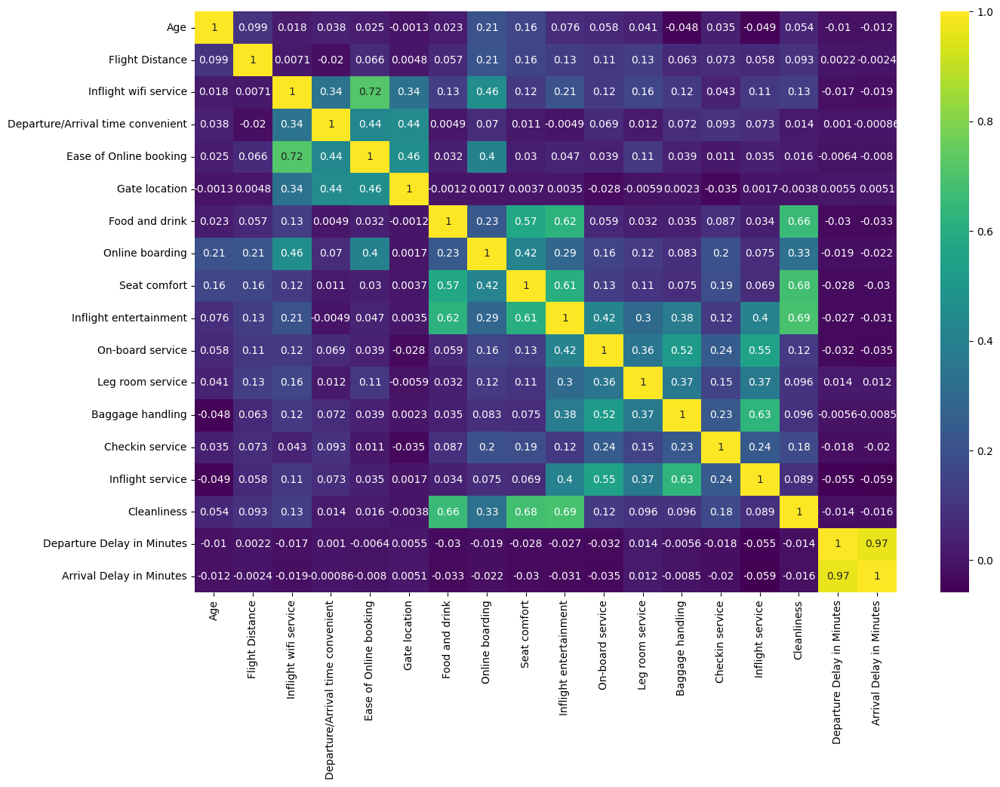

In [ ]:
plt.figure(figsize=(15,10))
corr1 = X_train[num].corr()
sns.heatmap(corr, annot = True, cmap='viridis')

# EDA

## Descriptive Analysis

In [ ]:
train_new.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,50912.0,39.344575,15.127978,7.0,27.0,40.0,51.0,85.0
Flight Distance,50912.0,1187.887610,997.888242,31.0,413.0,837.0,1742.0,4983.0
Inflight wifi service,50912.0,2.721834,1.327740,0.0,2.0,3.0,4.0,5.0
Departure/Arrival time convenient,50912.0,3.057236,1.528187,0.0,2.0,3.0,4.0,5.0
Ease of Online booking,50912.0,2.752220,1.401232,0.0,2.0,3.0,4.0,5.0
Gate location,50912.0,2.979121,1.278005,0.0,2.0,3.0,4.0,5.0
Food and drink,50912.0,3.197066,1.326491,0.0,2.0,3.0,4.0,5.0
Online boarding,50912.0,3.241849,1.352572,0.0,2.0,3.0,4.0,5.0
Seat comfort,50912.0,3.433375,1.321121,0.0,2.0,4.0,5.0,5.0
Inflight entertainment,50912.0,3.346853,1.331000,0.0,2.0,4.0,4.0,5.0


In [ ]:
train_new.describe(include='object').T

,count,unique,top,freq
Gender,50912,2,Female,25775
Customer Type,50912,2,Loyal Customer,41568
Type of Travel,50912,2,Business travel,35141
Class,50912,3,Business,24348


In [ ]:
train_new.isna().sum()

,0
Gender,0
Customer Type,0
Age,0
Type of Travel,0
Class,0
Flight Distance,0
Inflight wifi service,0
Departure/Arrival time convenient,0
Ease of Online booking,0
Gate location,0


In [ ]:
X_train.duplicated().sum()

0

Key_points:
- Missing value on `Arrival Delay in Minutes`

In [ ]:
X_train['Arrival Delay in Minutes'].value_counts()

,count
Arrival Delay in Minutes,
0.0,28438
1.0,1086
2.0,1027
3.0,989
4.0,907
...,...
308.0,1
410.0,1
351.0,1


## Bivariate analysis

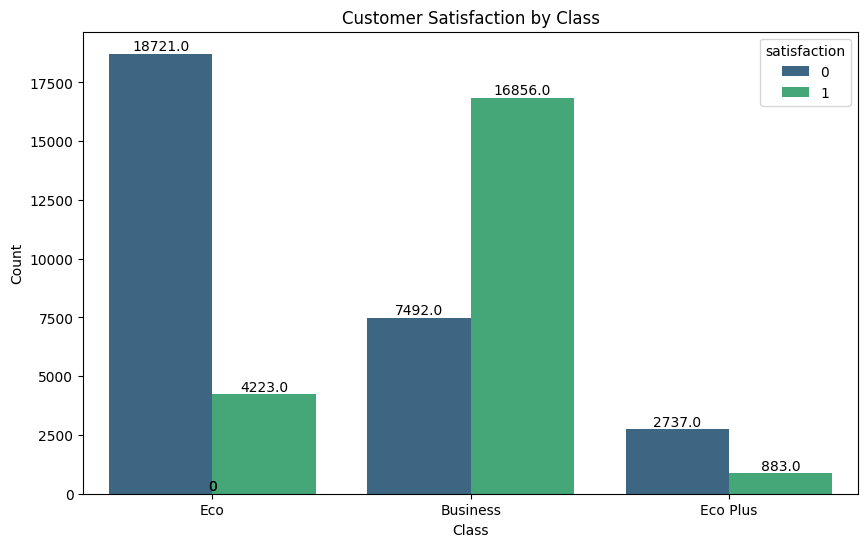

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Class', hue='satisfaction', data=train_new, palette='viridis')
plt.title('Customer Satisfaction by Class')
plt.xlabel('Class')
plt.ylabel('Count')

for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='center', xytext=(0, 5), textcoords='offset points')
plt.show()

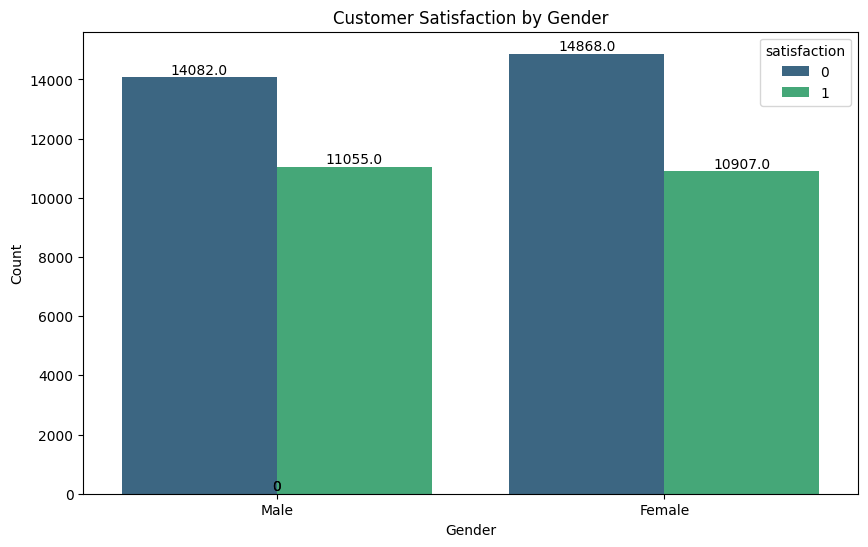

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Gender', hue='satisfaction', data=train_new, palette='viridis')
plt.title('Customer Satisfaction by Gender')
plt.xlabel('Gender')
plt.ylabel('Count')

for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='center', xytext=(0, 5), textcoords='offset points')
plt.show()

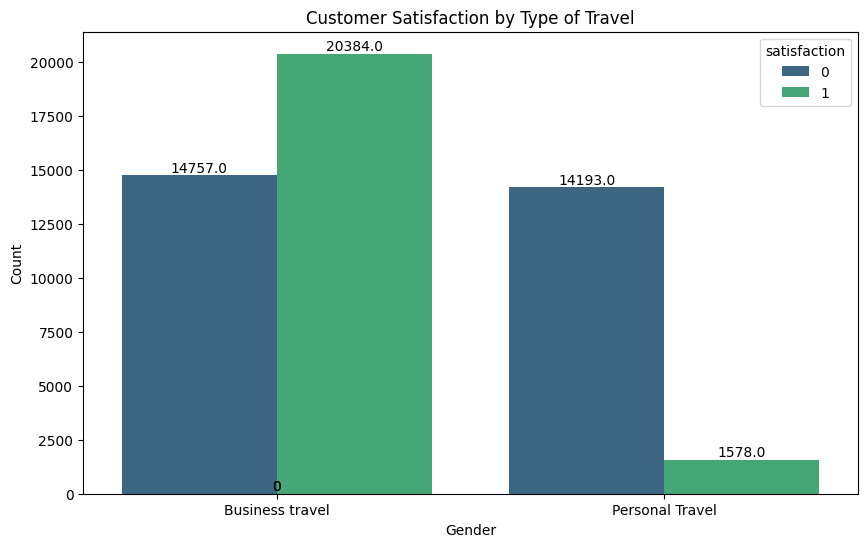

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Type of Travel', hue='satisfaction', data=train_new, palette='viridis')
plt.title('Customer Satisfaction by Type of Travel')
plt.xlabel('Gender')
plt.ylabel('Count')

for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='center', xytext=(0, 5), textcoords='offset points')
plt.show()

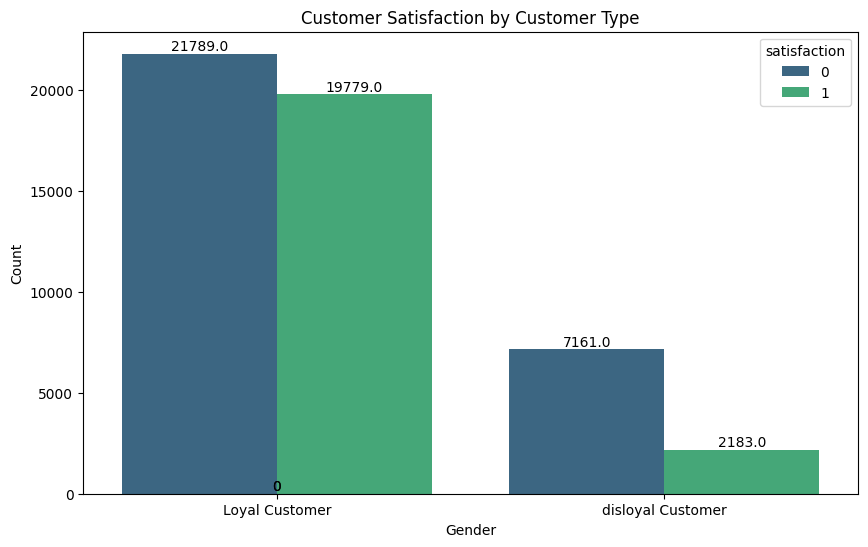

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Customer Type', hue='satisfaction', data=train_new, palette='viridis')
plt.title('Customer Satisfaction by Customer Type')
plt.xlabel('Gender')
plt.ylabel('Count')

for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='center', xytext=(0, 5), textcoords='offset points')
plt.show()

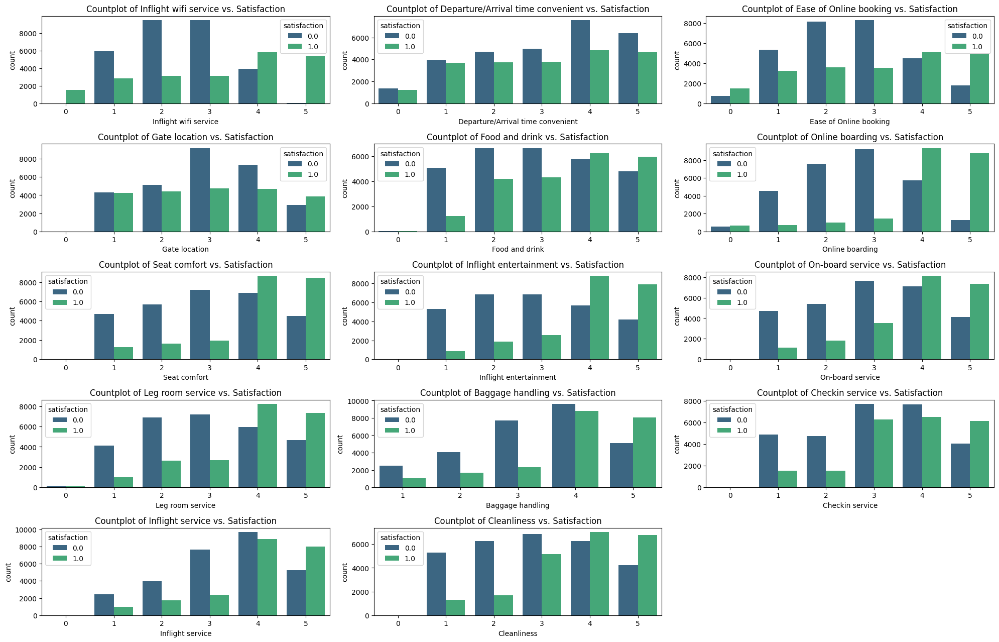

In [ ]:
plt.figure(figsize=(20, 15))

num_plots = len(num)  # Total number of numerical features
num_cols = 3  # Number of columns in the subplot grid
num_rows = int(np.ceil(num_plots / num_cols))  # Calculate number of rows needed

plot_index = 1  # Initialize plot index

for i in range(0, num_plots):
    if train_new[num[i]].nunique() < 6 or train_new[num[i]].nunique() < 7:
        plt.subplot(num_rows, num_cols, plot_index)  # Use calculated rows and columns
        sns.countplot(x=df[num[i]], hue='satisfaction', data=train_new, palette='viridis')
        plt.title(f'Countplot of {num[i]} vs. Satisfaction')
        plot_index += 1  # Increment plot index only if a plot is created

plt.tight_layout()
plt.show()

# Preprocessing Data

## Missing Value

Mising value in `Arrival Delau in Minutes`, we fill missing value with 0. It means that there was no delay.

In [ ]:
X_train['Arrival Delay in Minutes'] = X_train['Arrival Delay in Minutes'].fillna(X_train['Arrival Delay in Minutes'].median())
X_val['Arrival Delay in Minutes'] = X_val['Arrival Delay in Minutes'].fillna(X_train['Arrival Delay in Minutes'].median())
X_test['Arrival Delay in Minutes'] = X_test['Arrival Delay in Minutes'].fillna(X_train['Arrival Delay in Minutes'].median())

## Multi colinarity

In [ ]:
# calculate VIF scores
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
from statsmodels.tools.tools import add_constant

num = X_train.select_dtypes(include = 'number').columns
cat = X_train.select_dtypes(include = 'object').columns

X = add_constant(X_train[num])

vif_df = pd.DataFrame([vif(X.values, i)
               for i in range(X.shape[1])],
              index=X.columns).reset_index()
vif_df.columns = ['feature','vif_score']
vif_df = vif_df.loc[vif_df.feature!='const']
vif_df.sort_values(by = 'vif_score', axis = 0, ascending = False)

,feature,vif_score
18,Arrival Delay in Minutes,13.539626
17,Departure Delay in Minutes,13.529211
10,Inflight entertainment,3.729435
16,Cleanliness,2.826332
5,Ease of Online booking,2.656251
3,Inflight wifi service,2.399639
9,Seat comfort,2.353622
7,Food and drink,2.174948
15,Inflight service,2.053000
8,Online boarding,1.878693


Key points:
- `Arrival Delay in Minutes` and `Deparature delay in Minutes` have high vif score, it means that these features have high corelation with other features.
- If we depart late, it is very possible that we will arrive late

Drop Redundant Feature

Removing `Arrival Delay in Minutes`

In [ ]:
X_train = X_train.drop('Arrival Delay in Minutes', axis = 1)
X_val = X_val.drop('Arrival Delay in Minutes', axis = 1)
X_test = X_test.drop('Arrival Delay in Minutes', axis = 1)

In [ ]:
# calculate VIF scores
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
from statsmodels.tools.tools import add_constant

num = X_train.select_dtypes(include = 'number').columns
cat = X_train.select_dtypes(include = 'object').columns

X = add_constant(X_train[num])

vif_df = pd.DataFrame([vif(X.values, i)
               for i in range(X.shape[1])],
              index=X.columns).reset_index()
vif_df.columns = ['feature','vif_score']
vif_df = vif_df.loc[vif_df.feature!='const']
vif_df.sort_values(by = 'vif_score', axis = 0, ascending = False)

,feature,vif_score
10,Inflight entertainment,3.729344
16,Cleanliness,2.826331
5,Ease of Online booking,2.656251
3,Inflight wifi service,2.399588
9,Seat comfort,2.353594
7,Food and drink,2.174782
15,Inflight service,2.052328
8,Online boarding,1.878658
13,Baggage handling,1.874120
11,On-board service,1.754614


## Encoding

In [ ]:
cat = X_train.select_dtypes(include = 'object').columns
for col in cat:
    print(col)
    print(X_train[col].value_counts())
    print('--------------------')

Gender
Gender
Female    25775
Male      25137
Name: count, dtype: int64
--------------------
Customer Type
Customer Type
Loyal Customer       41568
disloyal Customer     9344
Name: count, dtype: int64
--------------------
Type of Travel
Type of Travel
Business travel    35141
Personal Travel    15771
Name: count, dtype: int64
--------------------
Class
Class
Business    24348
Eco         22944
Eco Plus     3620
Name: count, dtype: int64
--------------------


In [ ]:
from sklearn.preprocessing import LabelEncoder
encoders = {}
cat = X_train.select_dtypes(include = 'object').columns

# Fit and transform training data
for col in cat:
    le = LabelEncoder()
    X_train[col] = le.fit_transform(X_train[col])
    encoders[col] = le  # Save the encoder for later use

# Transform validation and test data
for col in cat:
    le = encoders[col]  # Retrieve the encoder for this column
    X_val[col] = le.transform(X_val[col])
    X_test[col] = le.transform(X_test[col])

In [ ]:
for col in X_train[['Gender','Customer Type', 'Type of Travel','Class']].columns:
    print(col)
    print(X_train[col].value_counts())
    print('--------------------')

Gender
Gender
0    25775
1    25137
Name: count, dtype: int64
--------------------
Customer Type
Customer Type
0    41568
1     9344
Name: count, dtype: int64
--------------------
Type of Travel
Type of Travel
0    35141
1    15771
Name: count, dtype: int64
--------------------
Class
Class
0    24348
1    22944
2     3620
Name: count, dtype: int64
--------------------


In [ ]:
X_train.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes
92051,1,0,66,0,1,1009,2,2,4,2,2,2,2,2,4,5,3,4,3,2,0
97264,1,0,61,1,0,163,1,5,0,4,5,5,5,5,5,0,5,5,5,5,0
58414,0,0,49,1,1,190,2,2,2,3,3,4,4,5,5,2,5,3,5,1,0
47188,0,0,53,0,0,1372,3,3,3,3,3,4,5,4,4,4,4,3,4,3,0
42326,0,0,63,0,0,972,4,4,4,4,2,4,5,2,2,2,2,3,2,5,0


In [ ]:
X_val.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes
49559,0,0,29,0,0,2026,1,3,1,1,5,5,5,5,4,1,3,2,4,5,13
39642,0,0,49,0,1,1028,4,3,3,3,1,3,4,4,4,4,4,4,4,2,38
3778,0,0,29,0,1,1012,2,5,5,5,2,2,2,1,2,2,2,2,4,2,156
14081,0,0,47,0,0,1725,5,5,5,5,3,5,4,4,4,4,4,3,4,4,10
16406,0,0,23,1,0,1452,2,0,3,3,5,3,5,5,3,5,4,3,4,5,12


In [ ]:
X_test.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes
80638,0,0,26,1,1,861,2,4,2,5,5,2,5,5,5,4,4,3,5,5,0
43398,1,0,22,0,0,393,3,5,5,5,3,3,3,3,1,1,3,2,3,3,0
32751,0,0,59,1,1,196,1,3,1,3,2,3,3,4,4,1,4,3,4,4,37
33571,0,0,32,1,1,1020,2,3,2,4,4,2,4,4,3,2,4,1,4,4,27
71287,1,1,35,0,0,1117,2,2,2,1,2,2,5,2,2,2,3,2,2,2,0


## Scaling

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Unbalance Handling

In [ ]:
y_train.value_counts(normalize=True)

,proportion
satisfaction,
0,0.568628
1,0.431372


We're not doing unbalance handling on this analysis

# Modelling

## Logistic Regression

Logistic Regression
              precision    recall  f1-score   support

           0       0.88      0.91      0.89     12374
           1       0.87      0.83      0.85      9446

    accuracy                           0.88     21820
   macro avg       0.88      0.87      0.87     21820
weighted avg       0.88      0.88      0.88     21820



Text(0.5, 1.0, 'Confusion Matrix')

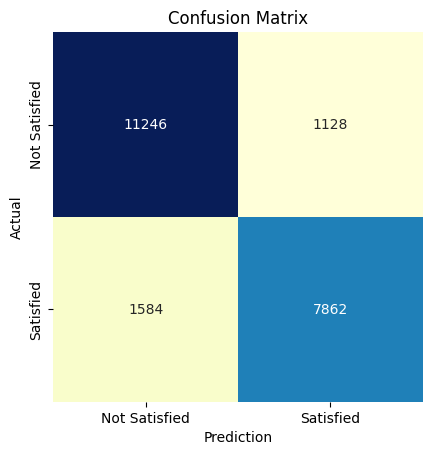

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
logreg = LogisticRegression()

logreg.fit(X_train_scaled, y_train)

#evaluation
y_val_pred = logreg.predict(X_val_scaled)
print('Logistic Regression')
print(classification_report(y_val, y_val_pred))

cm = confusion_matrix(y_val, y_val_pred)

class_names = ['Not Satisfied', 'Satisfied']

cmat_df = pd.DataFrame(cm, index=class_names, columns=class_names)

ax = sns.heatmap(cmat_df, square=True, annot=True, cbar=False, fmt='d', cmap="YlGnBu")
ax.set_xlabel('Prediction')
ax.set_ylabel('Actual')
ax.set_title("Confusion Matrix")

In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import f1_score


kf = KFold(n_splits=5, shuffle=True, random_state=42)
f1_scores = []

for train_index, val_index in kf.split(X_train_scaled):
    X_train_fold, X_val_fold = X_train_scaled[train_index], X_train_scaled[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    logreg.fit(X_train_fold, y_train_fold)
    y_pred_fold = logreg.predict(X_val_fold)
    f1 = f1_score(y_val_fold, y_pred_fold)
    f1_scores.append(f1)

print("Cross-validation f1_score:", f1_scores)
print("Average f1_score:", np.mean(f1_scores))

Cross-validation f1_score: [0.8530432770192086, 0.8520778174283412, 0.8438948995363215, 0.850737600185852, 0.8556605948812543]
Average f1_score: 0.8510828378101956


## Random Forest

### Base

RANDOM_FOREST
              precision    recall  f1-score   support

           0       0.95      0.98      0.97     12374
           1       0.97      0.94      0.96      9446

    accuracy                           0.96     21820
   macro avg       0.96      0.96      0.96     21820
weighted avg       0.96      0.96      0.96     21820



Text(0.5, 1.0, 'Confusion Matrix')

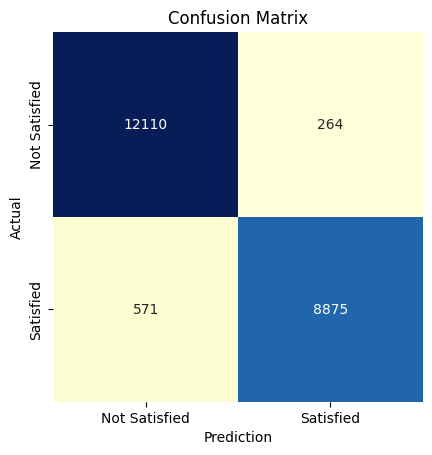

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
rf_clf = RandomForestClassifier(n_estimators=100)
rf_clf.fit(X_train,y_train)

#evaluation
y_val_pred = rf_clf.predict(X_val)
print('RANDOM_FOREST')
print(classification_report(y_val, y_val_pred))

y_val_pred = rf_clf.predict(X_val)
cm = confusion_matrix(y_val, y_val_pred)

class_names = ['Not Satisfied', 'Satisfied']

cmat_df = pd.DataFrame(cm, index=class_names, columns=class_names)

ax = sns.heatmap(cmat_df, square=True, annot=True, cbar=False, fmt='d', cmap="YlGnBu")
ax.set_xlabel('Prediction')
ax.set_ylabel('Actual')
ax.set_title("Confusion Matrix")

In [ ]:
# Extract feature importances
feature_importance = rf_clf.feature_importances_

# Extract feature names from the training data
feature_names = X_train.columns

# Create a DataFrame to display feature importance
df_feature_importance = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Sort the DataFrame by feature importance
df_feature_importance = df_feature_importance.sort_values(by='Importance', ascending=False)
df_feature_importance

,Feature,Importance
11,Online boarding,0.178459
6,Inflight wifi service,0.141658
4,Class,0.107446
3,Type of Travel,0.090960
13,Inflight entertainment,0.054310
12,Seat comfort,0.047598
5,Flight Distance,0.038612
15,Leg room service,0.037214
1,Customer Type,0.036254
8,Ease of Online booking,0.035658


### Tuning

In [ ]:
'''
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import f1_score
param_grid = {
    'n_estimators': [100,150],
    'max_depth': [ 20, 30],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
}

rf_clf = RandomForestClassifier(random_state=1000)

# Create the RandomizedSearchCV object
random_search = RandomizedSearchCV(
    estimator=rf_clf,
    param_distributions=param_grid,
    n_iter=30,  # Number of parameter settings sampled
    scoring='f1',  # Use accuracy as the evaluation metric
    cv=3,  # Use 5-fold cross-validation
    n_jobs=-1,  # Use all available CPU cores
    verbose=2,  # Increase verbosity for more output during the search
    random_state=42  # Set a random state for reproducibility
)

# Perform the random search
random_search.fit(X_train, y_train)

# Print the best hyperparameters and best score
print("Best hyperparameters:", random_search.best_params_)
print("Best score:", random_search.best_score_)

# Evaluate the best model on the validation set
best_rf_model = random_search.best_estimator_
y_pred_val = best_rf_model.predict(X_val)
print(classification_report(y_val_pred, y_pred_val))
'''

'\nfrom sklearn.model_selection import RandomizedSearchCV\nfrom sklearn.metrics import f1_score\nparam_grid = {\n    \'n_estimators\': [100,150],\n    \'max_depth\': [ 20, 30],\n    \'min_samples_split\': [2, 5],\n    \'min_samples_leaf\': [1, 2],\n}\n\nrf_clf = RandomForestClassifier(random_state=1000)\n\n# Create the RandomizedSearchCV object\nrandom_search = RandomizedSearchCV(\n    estimator=rf_clf,\n    param_distributions=param_grid,\n    n_iter=30,  # Number of parameter settings sampled\n    scoring=\'f1\',  # Use accuracy as the evaluation metric\n    cv=3,  # Use 5-fold cross-validation\n    n_jobs=-1,  # Use all available CPU cores\n    verbose=2,  # Increase verbosity for more output during the search\n    random_state=42  # Set a random state for reproducibility\n)\n\n# Perform the random search\nrandom_search.fit(X_train, y_train)\n\n# Print the best hyperparameters and best score\nprint("Best hyperparameters:", random_search.best_params_)\nprint("Best score:", random_sea

Best hyperparameters for random forest:
- 'n_estimators': 150
- 'min_samples_split': 2
- 'min_samples_leaf': 1
- 'max_depth': 30

RANDOM_FOREST
              precision    recall  f1-score   support

           0       0.96      0.98      0.97     12374
           1       0.97      0.94      0.96      9446

    accuracy                           0.96     21820
   macro avg       0.96      0.96      0.96     21820
weighted avg       0.96      0.96      0.96     21820



Text(0.5, 1.0, 'Confusion Matrix')

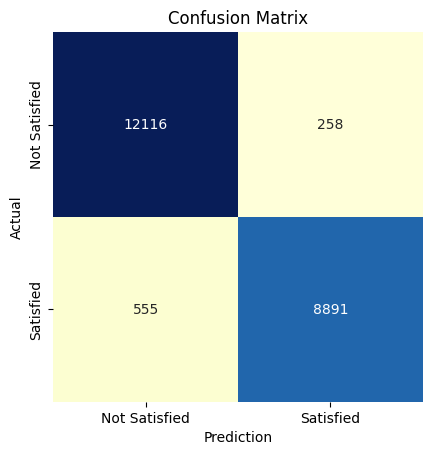

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
rf_clf = RandomForestClassifier(n_estimators=150, min_samples_split=5, min_samples_leaf=1, max_depth=30)
rf_clf.fit(X_train,y_train)
#evaluation
y_val_pred = rf_clf.predict(X_val)
print('RANDOM_FOREST')
print(classification_report(y_val, y_val_pred))

y_val_pred = rf_clf.predict(X_val)
cm = confusion_matrix(y_val, y_val_pred)

class_names = ['Not Satisfied', 'Satisfied']

cmat_df = pd.DataFrame(cm, index=class_names, columns=class_names)

ax = sns.heatmap(cmat_df, square=True, annot=True, cbar=False, fmt='d', cmap="YlGnBu")
ax.set_xlabel('Prediction')
ax.set_ylabel('Actual')
ax.set_title("Confusion Matrix")

In [ ]:
'''
y_val_pred = best_rf_model.predict(X_val)
cm = confusion_matrix(y_val, y_val_pred)

class_names = ['Not Satisfied', 'Satisfied']

cmat_df = pd.DataFrame(cm, index=class_names, columns=class_names)

ax = sns.heatmap(cmat_df, square=True, annot=True, cbar=False, fmt='d', cmap="YlGnBu")
ax.set_xlabel('Prediction')
ax.set_ylabel('Actual')
ax.set_title("Confusion Matrix")
'''

'\ny_val_pred = best_rf_model.predict(X_val)\ncm = confusion_matrix(y_val, y_val_pred)\n\nclass_names = [\'Not Satisfied\', \'Satisfied\']\n\ncmat_df = pd.DataFrame(cm, index=class_names, columns=class_names)\n\nax = sns.heatmap(cmat_df, square=True, annot=True, cbar=False, fmt=\'d\', cmap="YlGnBu")\nax.set_xlabel(\'Prediction\')\nax.set_ylabel(\'Actual\')\nax.set_title("Confusion Matrix")\n'

In [ ]:
'''
# Extract feature importances
feature_importance = best_rf_model.feature_importances_

# Extract feature names from the training data
feature_names = X_train.columns

# Create a DataFrame to display feature importance
df_feature_importance = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Sort the DataFrame by feature importance
df_feature_importance = df_feature_importance.sort_values(by='Importance', ascending=False)
df_feature_importance
'''

"\n# Extract feature importances\nfeature_importance = best_rf_model.feature_importances_\n\n# Extract feature names from the training data\nfeature_names = X_train.columns\n\n# Create a DataFrame to display feature importance\ndf_feature_importance = pd.DataFrame({\n    'Feature': feature_names,\n    'Importance': feature_importance\n})\n\n# Sort the DataFrame by feature importance\ndf_feature_importance = df_feature_importance.sort_values(by='Importance', ascending=False)\ndf_feature_importance\n"

In [ ]:
# Extract feature importances
feature_importance = rf_clf.feature_importances_

# Extract feature names from the training data
feature_names = X_train.columns

# Create a DataFrame to display feature importance
df_feature_importance = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Sort the DataFrame by feature importance
df_feature_importance = df_feature_importance.sort_values(by='Importance', ascending=False)
df_feature_importance

,Feature,Importance
11,Online boarding,0.173968
6,Inflight wifi service,0.153371
4,Class,0.105393
3,Type of Travel,0.100356
13,Inflight entertainment,0.056755
12,Seat comfort,0.042733
1,Customer Type,0.038162
5,Flight Distance,0.037369
15,Leg room service,0.037146
8,Ease of Online booking,0.036654


In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import f1_score


kf = KFold(n_splits=5, shuffle=True, random_state=42)
f1_scores = []

for train_index, val_index in kf.split(X_train):
    X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    logreg.fit(X_train_fold, y_train_fold)
    y_pred_fold = rf_clf.predict(X_val_fold)
    f1 = f1_score(y_val_fold, y_pred_fold)
    f1_scores.append(f1)

print("Cross-validation f1_score:", f1_scores)
print("Average f1_score:", np.mean(f1_scores))

Cross-validation f1_score: [0.9947786606129398, 0.995342496876065, 0.9954316504626918, 0.9952337721289151, 0.9947786606129398]
Average f1_score: 0.9951130481387102


## XGBOOST

### base

XGBOOST
              precision    recall  f1-score   support

           0       0.96      0.98      0.97     12374
           1       0.97      0.95      0.96      9446

    accuracy                           0.96     21820
   macro avg       0.97      0.96      0.96     21820
weighted avg       0.96      0.96      0.96     21820



Text(0.5, 1.0, 'Confusion Matrix')

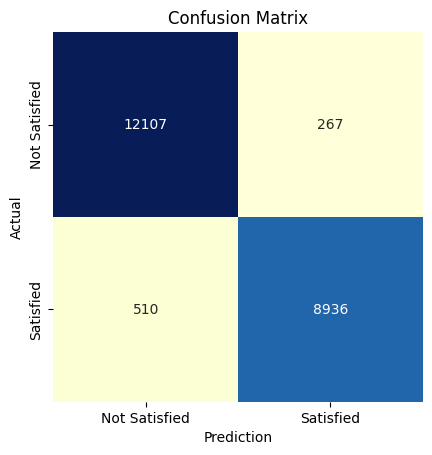

In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
xgb_clf = XGBClassifier(random_state = 1000)

xgb_clf.fit(X_train, y_train)

#evaluation
y_val_pred = xgb_clf.predict(X_val)
print('XGBOOST')
print(classification_report(y_val, y_val_pred))

cm = confusion_matrix(y_val, y_val_pred)

class_names = ['Not Satisfied', 'Satisfied']

cmat_df = pd.DataFrame(cm, index=class_names, columns=class_names)

ax = sns.heatmap(cmat_df, square=True, annot=True, cbar=False, fmt='d', cmap="YlGnBu")
ax.set_xlabel('Prediction')
ax.set_ylabel('Actual')
ax.set_title("Confusion Matrix")

In [ ]:
# Extract feature importances
feature_importance = xgb_clf.feature_importances_

# Extract feature names from the training data
feature_names = X_train.columns

# Create a DataFrame to display feature importance
df_feature_importance = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Sort the DataFrame by feature importance
df_feature_importance = df_feature_importance.sort_values(by='Importance', ascending=False)
df_feature_importance

,Feature,Importance
11,Online boarding,0.457221
3,Type of Travel,0.135057
6,Inflight wifi service,0.096074
1,Customer Type,0.053433
4,Class,0.045305
13,Inflight entertainment,0.039579
17,Checkin service,0.028344
12,Seat comfort,0.019444
15,Leg room service,0.018353
18,Inflight service,0.016703


### Tuning

In [ ]:
'''
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import f1_score

# Define the parameter grid for random search
param_grid = {
    'n_estimators': [200, 300, 400, 500],
    'max_depth': [3, 5, 7, 9, 11],
    'learning_rate': [0.01, 0.1, 0.3],
    'min_child_weight': [3, 5]
}

# Create the XGBClassifier
xgb_clf = XGBClassifier(random_state=1000)

# Create the RandomizedSearchCV object
random_search = RandomizedSearchCV(
    estimator=xgb_clf,
    param_distributions=param_grid,
    n_iter=30,  # Number of parameter settings sampled
    scoring='f1',  # Use accuracy as the evaluation metric
    cv=3,  # Use 5-fold cross-validation
    n_jobs=-1,  # Use all available CPU cores
    verbose=2,  # Increase verbosity for more output during the search
    random_state=42  # Set a random state for reproducibility
)


# Perform the random search
random_search.fit(X_train, y_train)

# Print the best hyperparameters and best score
print("Best hyperparameters:", random_search.best_params_)
print("Best score:", random_search.best_score_)

# Evaluate the best model on the validation set
best_xgb_model = random_search.best_estimator_
y_pred_val = best_xgb_model.predict(X_val)
print(classification_report(y_val, y_pred_val))
'''

'\nfrom sklearn.model_selection import RandomizedSearchCV\nfrom sklearn.metrics import f1_score\n\n# Define the parameter grid for random search\nparam_grid = {\n    \'n_estimators\': [200, 300, 400, 500],\n    \'max_depth\': [3, 5, 7, 9, 11],\n    \'learning_rate\': [0.01, 0.1, 0.3],\n    \'min_child_weight\': [3, 5]\n}\n\n# Create the XGBClassifier\nxgb_clf = XGBClassifier(random_state=1000)\n\n# Create the RandomizedSearchCV object\nrandom_search = RandomizedSearchCV(\n    estimator=xgb_clf,\n    param_distributions=param_grid,\n    n_iter=30,  # Number of parameter settings sampled\n    scoring=\'f1\',  # Use accuracy as the evaluation metric\n    cv=3,  # Use 5-fold cross-validation\n    n_jobs=-1,  # Use all available CPU cores\n    verbose=2,  # Increase verbosity for more output during the search\n    random_state=42  # Set a random state for reproducibility\n)\n\n\n# Perform the random search\nrandom_search.fit(X_train, y_train)\n\n# Print the best hyperparameters and best sco

Best hyperparameters for XGBoost:
- 'n_estimators': 200
- 'min_child_weight': 5
- 'max_depth': 11
- 'learning_rate': 0.1

XGBOOST
              precision    recall  f1-score   support

           0       0.96      0.98      0.97     12374
           1       0.97      0.95      0.96      9446

    accuracy                           0.96     21820
   macro avg       0.96      0.96      0.96     21820
weighted avg       0.96      0.96      0.96     21820



Text(0.5, 1.0, 'Confusion Matrix')

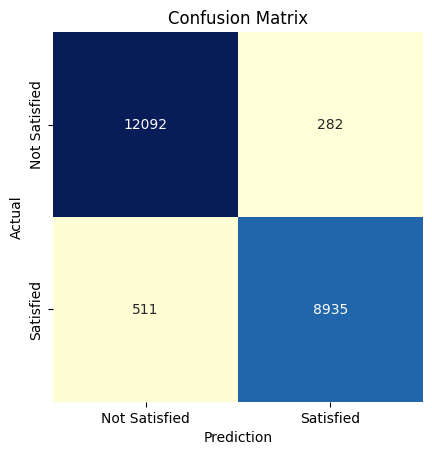

In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
xgb_clf = XGBClassifier(random_state = 42, n_estimators = 200, min_child_weight = 5, max_depth = 11, learning_rate = 0.1)

xgb_clf.fit(X_train, y_train)

#evaluation
y_val_pred = xgb_clf.predict(X_val)
print('XGBOOST')
print(classification_report(y_val, y_val_pred))

cm = confusion_matrix(y_val, y_val_pred)

class_names = ['Not Satisfied', 'Satisfied']

cmat_df = pd.DataFrame(cm, index=class_names, columns=class_names)

ax = sns.heatmap(cmat_df, square=True, annot=True, cbar=False, fmt='d', cmap="YlGnBu")
ax.set_xlabel('Prediction')
ax.set_ylabel('Actual')
ax.set_title("Confusion Matrix")

In [ ]:
'''
y_val_pred = best_xgb_model.predict(X_val)
cm = confusion_matrix(y_val, y_val_pred)

class_names = ['Not Satisfied', 'Satisfied']

cmat_df = pd.DataFrame(cm, index=class_names, columns=class_names)

ax = sns.heatmap(cmat_df, square=True, annot=True, cbar=False, fmt='d', cmap="YlGnBu")
ax.set_xlabel('Prediction')
ax.set_ylabel('Actual')
ax.set_title("Confusion Matrix")
'''

'\ny_val_pred = best_xgb_model.predict(X_val)\ncm = confusion_matrix(y_val, y_val_pred)\n\nclass_names = [\'Not Satisfied\', \'Satisfied\']\n\ncmat_df = pd.DataFrame(cm, index=class_names, columns=class_names)\n\nax = sns.heatmap(cmat_df, square=True, annot=True, cbar=False, fmt=\'d\', cmap="YlGnBu")\nax.set_xlabel(\'Prediction\')\nax.set_ylabel(\'Actual\')\nax.set_title("Confusion Matrix")\n'

In [ ]:
# Extract feature importances
feature_importance = xgb_clf.feature_importances_

# Extract feature names from the training data
feature_names = X_train.columns

# Create a DataFrame to display feature importance
df_feature_importance = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Sort the DataFrame by feature importance
df_feature_importance = df_feature_importance.sort_values(by='Importance', ascending=False)
df_feature_importance

,Feature,Importance
11,Online boarding,0.403573
3,Type of Travel,0.203012
6,Inflight wifi service,0.115738
1,Customer Type,0.053760
13,Inflight entertainment,0.042273
4,Class,0.037004
17,Checkin service,0.020411
9,Gate location,0.015955
15,Leg room service,0.014664
16,Baggage handling,0.013978


In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import f1_score


kf = KFold(n_splits=5, shuffle=True, random_state=42)
f1_scores = []

for train_index, val_index in kf.split(X_train):
    X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    logreg.fit(X_train_fold, y_train_fold)
    y_pred_fold = xgb_clf.predict(X_val_fold)
    f1 = f1_score(y_val_fold, y_pred_fold)
    f1_scores.append(f1)

print("Cross-validation f1_score:", f1_scores)
print("Average f1_score:", np.mean(f1_scores))

Cross-validation f1_score: [0.9910217070121605, 0.9929497384580396, 0.9919042590637099, 0.9911343487156172, 0.9917054880127258]
Average f1_score: 0.9917431082524507


## LightGBM

### base

In [ ]:
!pip install lightgbm

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 21962, number of negative: 28950
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010915 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 679
[LightGBM] [Info] Number of data points in the train set: 50912, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.431372 -> initscore=-0.276257
[LightGBM] [Info] Start training from score -0.276257
LIGHT_GBM
              precision    recall  f1-score   support

           0       0.96      0.98      0.97     12374
           1       0.98      0.94      0.96      9446

    accuracy                           0.97     21820
   macro avg       0.97      0.96      0.96     21820
weighted avg       0.97      0.97      0.96     21820



Text(0.5, 1.0, 'Confusion Matrix')

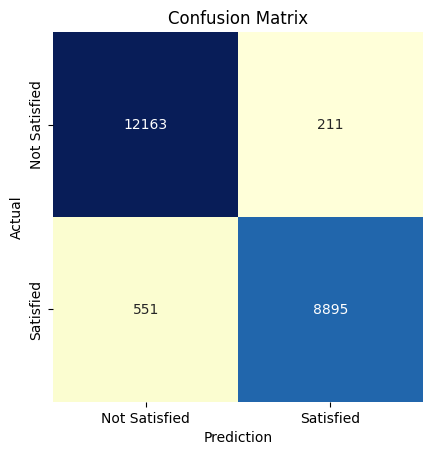

In [ ]:
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
lgbm_clf = LGBMClassifier()
lgbm_clf.fit(X_train, y_train)

#evaluation
y_val_pred = lgbm_clf.predict(X_val)
print('LIGHT_GBM')
print(classification_report(y_val, y_val_pred))

cm = confusion_matrix(y_val, y_val_pred)

class_names = ['Not Satisfied', 'Satisfied']

cmat_df = pd.DataFrame(cm, index=class_names, columns=class_names)

ax = sns.heatmap(cmat_df, square=True, annot=True, cbar=False, fmt='d', cmap="YlGnBu")
ax.set_xlabel('Prediction')
ax.set_ylabel('Actual')
ax.set_title("Confusion Matrix")

In [ ]:
# Extract feature importances
feature_importance = lgbm_clf.feature_importances_

# Extract feature names from the training data
feature_names = X_train.columns

# Create a DataFrame to display feature importance
df_feature_importance = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Sort the DataFrame by feature importance
df_feature_importance = df_feature_importance.sort_values(by='Importance', ascending=False)
df_feature_importance

,Feature,Importance
6,Inflight wifi service,486
2,Age,283
5,Flight Distance,215
16,Baggage handling,178
1,Customer Type,175
11,Online boarding,155
4,Class,145
13,Inflight entertainment,141
9,Gate location,135
3,Type of Travel,135


### Tuning

In [ ]:
'''
from lightgbm import LGBMClassifier

param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'num_leaves': [31, 50, 100],
    'max_depth': [-1, 5, 10],
    'min_child_samples': [20, 50, 100]
}

# Create the LGBMClassifier
lgbm_clf = LGBMClassifier(random_state=1000)

# Create the RandomizedSearchCV object
random_search = RandomizedSearchCV(
    estimator=lgbm_clf,
    param_distributions=param_grid,
    n_iter=30,  # Number of parameter settings sampled
    scoring='f1',  # Use accuracy as the evaluation metric
    cv=3,  # Use 5-fold cross-validation
    n_jobs=-1,  # Use all available CPU cores
    verbose=2,  # Increase verbosity for more output during the search
    random_state=42  # Set a random state for reproducibility
)

# Perform the random search
random_search.fit(X_train, y_train)

# Print the best hyperparameters and best score
print("Best hyperparameters:", random_search.best_params_)
print("Best score:", random_search.best_score_)

# Evaluate the best model on the validation set
best_lgbm_model = random_search.best_estimator_
y_pred_val = best_lgbm_model.predict(X_val)
print(classification_report(y_val, y_pred_val))
'''

'\nfrom lightgbm import LGBMClassifier\n\nparam_grid = {\n    \'n_estimators\': [100, 200, 300],\n    \'learning_rate\': [0.01, 0.1, 0.2],\n    \'num_leaves\': [31, 50, 100],\n    \'max_depth\': [-1, 5, 10],\n    \'min_child_samples\': [20, 50, 100]\n}\n\n# Create the LGBMClassifier\nlgbm_clf = LGBMClassifier(random_state=1000)\n\n# Create the RandomizedSearchCV object\nrandom_search = RandomizedSearchCV(\n    estimator=lgbm_clf,\n    param_distributions=param_grid,\n    n_iter=30,  # Number of parameter settings sampled\n    scoring=\'f1\',  # Use accuracy as the evaluation metric\n    cv=3,  # Use 5-fold cross-validation\n    n_jobs=-1,  # Use all available CPU cores\n    verbose=2,  # Increase verbosity for more output during the search\n    random_state=42  # Set a random state for reproducibility\n)\n\n# Perform the random search\nrandom_search.fit(X_train, y_train)\n\n# Print the best hyperparameters and best score\nprint("Best hyperparameters:", random_search.best_params_)\nprin

Best hyperparameters for LightGBM:
- 'num_leaves': 50
- 'n_estimators': 100
- 'min_child_samples': 20
- 'max_depth': -1
- 'learning_rate': 0.1

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 21962, number of negative: 28950
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009153 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 679
[LightGBM] [Info] Number of data points in the train set: 50912, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.431372 -> initscore=-0.276257
[LightGBM] [Info] Start training from score -0.276257
LIGHT_GBM
              precision    recall  f1-score   support

           0       0.96      0.98      0.97     12374
           1       0.98      0.94      0.96      9446

    accuracy                           0.97     21820
   macro avg       0.97      0.96      0.96     21820
weighted avg       0.97      0.97      0.97     21820



Text(0.5, 1.0, 'Confusion Matrix')

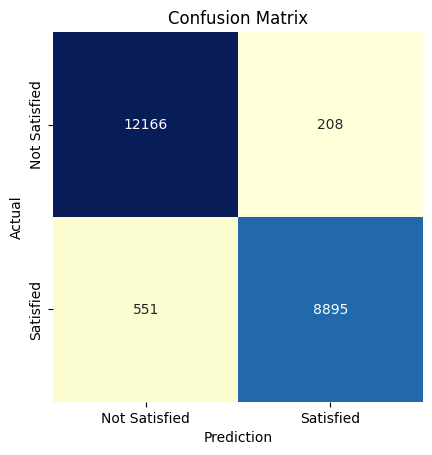

In [ ]:
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
lgbm_clf = LGBMClassifier(num_leaves = 50, n_estimators = 100, min_child_samples = 20, max_depth = -1, learning_rate = 0.1)
lgbm_clf.fit(X_train, y_train)

#evaluation
y_val_pred = lgbm_clf.predict(X_val)
print('LIGHT_GBM')
print(classification_report(y_val, y_val_pred))

cm = confusion_matrix(y_val, y_val_pred)

class_names = ['Not Satisfied', 'Satisfied']

cmat_df = pd.DataFrame(cm, index=class_names, columns=class_names)

ax = sns.heatmap(cmat_df, square=True, annot=True, cbar=False, fmt='d', cmap="YlGnBu")
ax.set_xlabel('Prediction')
ax.set_ylabel('Actual')
ax.set_title("Confusion Matrix")

In [ ]:
'''
y_val_pred = best_lgbm_model.predict(X_val)
cm = confusion_matrix(y_val, y_val_pred)

class_names = ['Not Satisfied', 'Satisfied']

cmat_df = pd.DataFrame(cm, index=class_names, columns=class_names)

ax = sns.heatmap(cmat_df, square=True, annot=True, cbar=False, fmt='d', cmap="YlGnBu")
ax.set_xlabel('Prediction')
ax.set_ylabel('Actual')
ax.set_title("Confusion Matrix")
'''

'\ny_val_pred = best_lgbm_model.predict(X_val)\ncm = confusion_matrix(y_val, y_val_pred)\n\nclass_names = [\'Not Satisfied\', \'Satisfied\']\n\ncmat_df = pd.DataFrame(cm, index=class_names, columns=class_names)\n\nax = sns.heatmap(cmat_df, square=True, annot=True, cbar=False, fmt=\'d\', cmap="YlGnBu")\nax.set_xlabel(\'Prediction\')\nax.set_ylabel(\'Actual\')\nax.set_title("Confusion Matrix")\n'

In [ ]:
# Extract feature importances
feature_importance = lgbm_clf.feature_importances_

# Extract feature names from the training data
feature_names = X_train.columns

# Create a DataFrame to display feature importance
df_feature_importance = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Sort the DataFrame by feature importance
df_feature_importance = df_feature_importance.sort_values(by='Importance', ascending=False)
df_feature_importance

,Feature,Importance
6,Inflight wifi service,596
2,Age,520
5,Flight Distance,442
16,Baggage handling,305
1,Customer Type,278
18,Inflight service,241
9,Gate location,240
20,Departure Delay in Minutes,224
12,Seat comfort,217
17,Checkin service,214


In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import f1_score


kf = KFold(n_splits=5, shuffle=True, random_state=42)
f1_scores = []

for train_index, val_index in kf.split(X_train):
    X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    logreg.fit(X_train_fold, y_train_fold)
    y_pred_fold = lgbm_clf.predict(X_val_fold)
    f1 = f1_score(y_val_fold, y_pred_fold)
    f1_scores.append(f1)

print("Cross-validation f1_score:", f1_scores)
print("Average f1_score:", np.mean(f1_scores))

Cross-validation f1_score: [0.9661036424221533, 0.9684840119622729, 0.9689839572192513, 0.9691265924480661, 0.967035500230521]
Average f1_score: 0.9679467408564528


## Model SUMMARY using AUC

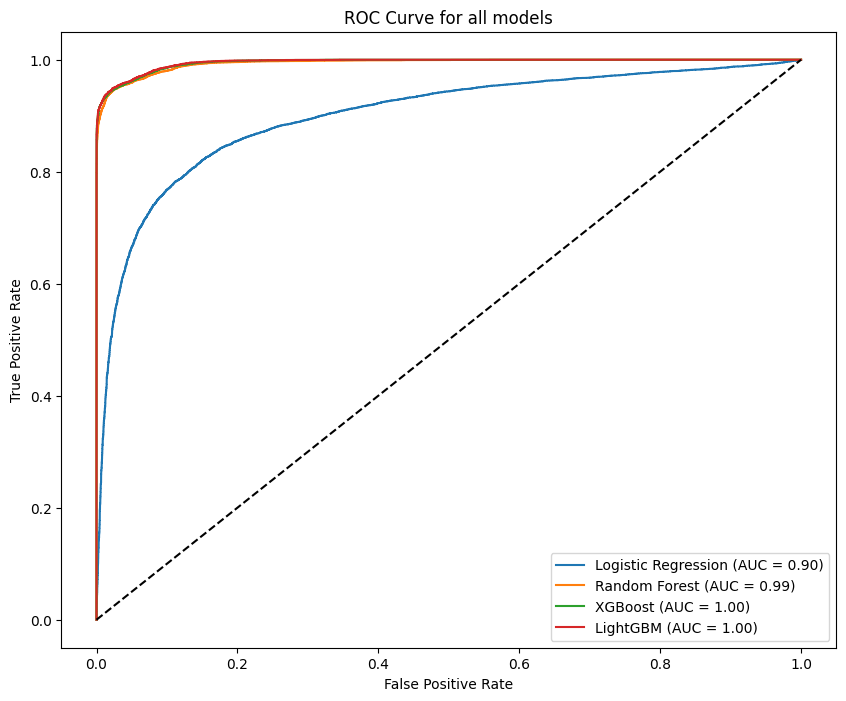

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Assuming you have your models and predictions stored in these variables:
models = {
    'Logistic Regression': logreg,
    'Random Forest': rf_clf,#best_rf_model,
    'XGBoost': xgb_clf,#best_xgb_model,
    'LightGBM': lgbm_clf#best_lgbm_model
}

plt.figure(figsize=(10, 8))

for model_name, model in models.items():
    y_pred_prob = model.predict_proba(X_val)[:, 1]  # Probability of positive class
    fpr, tpr, _ = roc_curve(y_val, y_pred_prob)
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for all models')
plt.legend(loc='lower right')
plt.show()

The Logistic Regression Model Out fared better than Random Forest, XGBoost, and LightGBM, as shown by the ROC curve above. This is typical since complex datasets are not a good fit for logistic regression. As our baseline model, we are employing logistic regression.

# Evaluation

### Logistic Regression

LOGISTIC REGRESSION
              precision    recall  f1-score   support

           0       0.85      0.82      0.83     17555
           1       0.78      0.81      0.79     13617

    accuracy                           0.82     31172
   macro avg       0.81      0.82      0.81     31172
weighted avg       0.82      0.82      0.82     31172



Text(0.5, 1.0, 'Confusion Matrix')

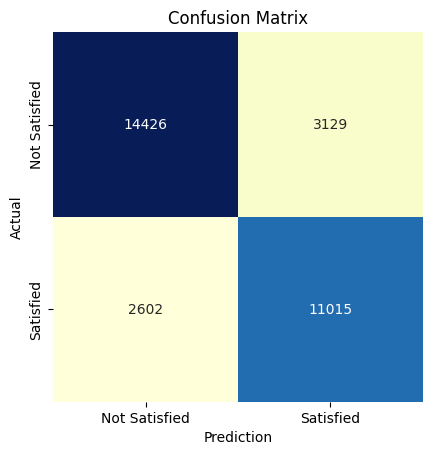

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

y_test_pred_logreg = logreg.predict(X_test_scaled)
print('LOGISTIC REGRESSION')
print(classification_report(y_test, y_test_pred_logreg))

cm = confusion_matrix(y_test, y_test_pred_logreg)

class_names = ['Not Satisfied', 'Satisfied']

cmat_df = pd.DataFrame(cm, index=class_names, columns=class_names)

ax = sns.heatmap(cmat_df, square=True, annot=True, cbar=False, fmt='d', cmap="YlGnBu")
ax.set_xlabel('Prediction')
ax.set_ylabel('Actual')
ax.set_title("Confusion Matrix")

## Random Forest

RANDOM_FOREST
              precision    recall  f1-score   support

           0       0.96      0.98      0.97     17555
           1       0.97      0.94      0.96     13617

    accuracy                           0.96     31172
   macro avg       0.96      0.96      0.96     31172
weighted avg       0.96      0.96      0.96     31172



Text(0.5, 1.0, 'Confusion Matrix')

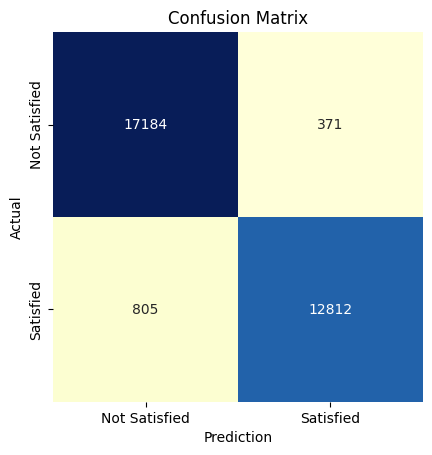

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

y_test_pred_rf = rf_clf.predict(X_test)
print('RANDOM_FOREST')
print(classification_report(y_test, y_test_pred_rf))

cm = confusion_matrix(y_test, y_test_pred_rf)

class_names = ['Not Satisfied', 'Satisfied']

cmat_df = pd.DataFrame(cm, index=class_names, columns=class_names)

ax = sns.heatmap(cmat_df, square=True, annot=True, cbar=False, fmt='d', cmap="YlGnBu")
ax.set_xlabel('Prediction')
ax.set_ylabel('Actual')
ax.set_title("Confusion Matrix")

In [ ]:
rf_pred_proba = rf_clf.predict_proba(X_test)

In [ ]:
# Extract feature importances
feature_importance = rf_clf.feature_importances_

# Extract feature names from the training data
feature_names = X_train.columns

# Create a DataFrame to display feature importance
df_feature_importance = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Sort the DataFrame by feature importance
df_feature_importance = df_feature_importance.sort_values(by='Importance', ascending=False)
df_feature_importance

,Feature,Importance
11,Online boarding,0.173968
6,Inflight wifi service,0.153371
4,Class,0.105393
3,Type of Travel,0.100356
13,Inflight entertainment,0.056755
12,Seat comfort,0.042733
1,Customer Type,0.038162
5,Flight Distance,0.037369
15,Leg room service,0.037146
8,Ease of Online booking,0.036654


## XGBOOST

XGBOOST
              precision    recall  f1-score   support

           0       0.95      0.98      0.97     17555
           1       0.97      0.94      0.95     13617

    accuracy                           0.96     31172
   macro avg       0.96      0.96      0.96     31172
weighted avg       0.96      0.96      0.96     31172



Text(0.5, 1.0, 'Confusion Matrix')

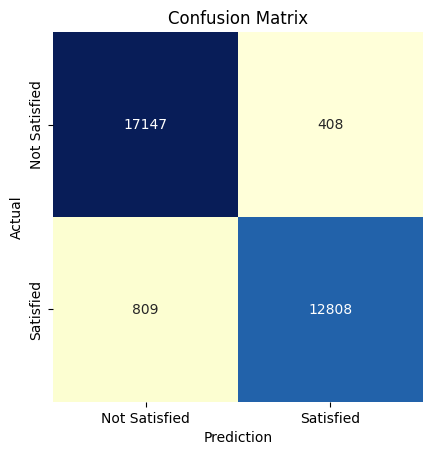

In [ ]:
y_test_pred_xgb = xgb_clf.predict(X_test)
print('XGBOOST')
print(classification_report(y_test, y_test_pred_xgb))

cm = confusion_matrix(y_test, y_test_pred_xgb)

class_names = ['Not Satisfied', 'Satisfied']

cmat_df = pd.DataFrame(cm, index=class_names, columns=class_names)

ax = sns.heatmap(cmat_df, square=True, annot=True, cbar=False, fmt='d', cmap="YlGnBu")
ax.set_xlabel('Prediction')
ax.set_ylabel('Actual')
ax.set_title("Confusion Matrix")

In [ ]:
xgb_pred_proba = xgb_clf.predict_proba(X_test)

In [ ]:
# Extract feature importances
feature_importance = xgb_clf.feature_importances_

# Extract feature names from the training data
feature_names = X_train.columns

# Create a DataFrame to display feature importance
df_feature_importance = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Sort the DataFrame by feature importance
df_feature_importance = df_feature_importance.sort_values(by='Importance', ascending=False)
df_feature_importance

,Feature,Importance
11,Online boarding,0.403573
3,Type of Travel,0.203012
6,Inflight wifi service,0.115738
1,Customer Type,0.053760
13,Inflight entertainment,0.042273
4,Class,0.037004
17,Checkin service,0.020411
9,Gate location,0.015955
15,Leg room service,0.014664
16,Baggage handling,0.013978


## LightGBM

LIGHT_GBM
              precision    recall  f1-score   support

           0       0.96      0.98      0.97     17555
           1       0.97      0.94      0.96     13617

    accuracy                           0.96     31172
   macro avg       0.97      0.96      0.96     31172
weighted avg       0.96      0.96      0.96     31172



Text(0.5, 1.0, 'Confusion Matrix')

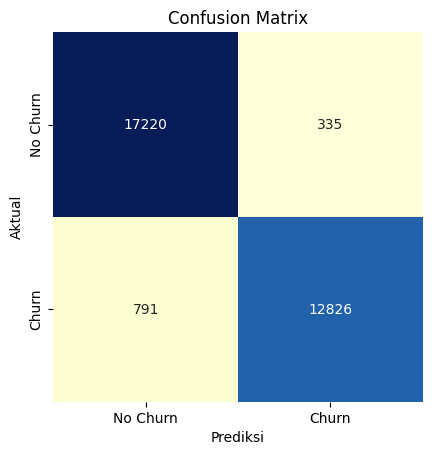

In [ ]:
y_test_pred_lgbm = lgbm_clf.predict(X_test)
print('LIGHT_GBM')
print(classification_report(y_test, y_test_pred_lgbm))

cm = confusion_matrix(y_test, y_test_pred_lgbm)

class_names = ['No Churn', 'Churn']

cmat_df = pd.DataFrame(cm, index=class_names, columns=class_names)

ax = sns.heatmap(cmat_df, square=True, annot=True, cbar=False, fmt='d', cmap="YlGnBu")
ax.set_xlabel('Prediksi')
ax.set_ylabel('Aktual')
ax.set_title("Confusion Matrix")

In [ ]:
lgbm_pred_proba = lgbm_clf.predict_proba(X_test)

In [ ]:
# Extract feature importances
feature_importance = lgbm_clf.feature_importances_

# Extract feature names from the training data
feature_names = X_train.columns

# Create a DataFrame to display feature importance
df_feature_importance = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance
})

# Sort the DataFrame by feature importance
df_feature_importance = df_feature_importance.sort_values(by='Importance', ascending=False)
df_feature_importance

,Feature,Importance
6,Inflight wifi service,596
2,Age,520
5,Flight Distance,442
16,Baggage handling,305
1,Customer Type,278
18,Inflight service,241
9,Gate location,240
20,Departure Delay in Minutes,224
12,Seat comfort,217
17,Checkin service,214


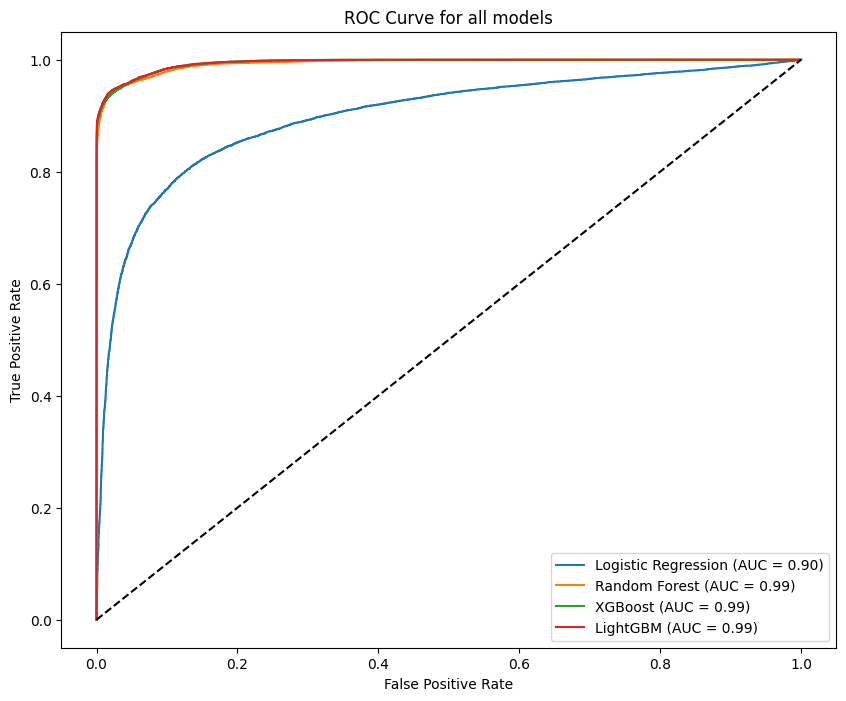

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Assuming you have your models and predictions stored in these variables:
models = {
    'Logistic Regression': logreg,
    'Random Forest': rf_clf,#best_rf_model,
    'XGBoost': xgb_clf,#best_xgb_model,
    'LightGBM': lgbm_clf#best_lgbm_model
}

plt.figure(figsize=(10, 8))

for model_name, model in models.items():
    y_pred_prob = model.predict_proba(X_test)[:, 1]  # Probability of positive class
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for all models')
plt.legend(loc='lower right')
plt.show()

## Model Performance Summary

In [ ]:
from sklearn.metrics import classification_report
import pandas as pd

models = {
    'Logistic Regression': logreg,
    'Random Forest': rf_clf,
    'XGBoost': xgb_clf,
    'LightGBM': lgbm_clf
}

results = []
for model_name, model in models.items():
    y_pred_test = model.predict(X_test)
    report = classification_report(y_test, y_pred_test, output_dict=True)
    results.append({
        'Model': model_name,
        'Precision (0)': report['0']['precision'],
        'Recall (0)': report['0']['recall'],
        'F1-score (0)': report['0']['f1-score'],
        'Support (0)': report['0']['support'],
        'Precision (1)': report['1']['precision'],
        'Recall (1)': report['1']['recall'],
        'F1-score (1)': report['1']['f1-score'],
        'Support (1)': report['1']['support'],
        'Accuracy': report['accuracy'],
        'Macro avg F1': report['macro avg']['f1-score'],
        'Weighted avg F1': report['weighted avg']['f1-score']
    })
df_results = pd.DataFrame(results)

In [ ]:
df_results.sort_values(by='F1-score (0)', ascending=False)

,Model,Precision (0),Recall (0),F1-score (0),Support (0),Precision (1),Recall (1),F1-score (1),Support (1),Accuracy,Macro avg F1,Weighted avg F1
3,LightGBM,0.956082,0.980917,0.968341,17555.0,0.974546,0.941911,0.957951,13617.0,0.963878,0.963146,0.963802
1,Random Forest,0.955250,0.978866,0.966914,17555.0,0.971858,0.940883,0.956119,13617.0,0.962274,0.961517,0.962199
2,XGBoost,0.954945,0.976759,0.965729,17555.0,0.969128,0.940589,0.954645,13617.0,0.960959,0.960187,0.960887
0,Logistic Regression,0.857599,0.856280,0.856939,17555.0,0.815084,0.816700,0.815891,13617.0,0.838990,0.836415,0.839008


In [ ]:
from sklearn.metrics import classification_report
import pandas as pd

models = {
    'Logistic Regression': logreg,
    'Random Forest': rf_clf,
    'XGBoost': xgb_clf,
    'LightGBM': lgbm_clf
}

results = []
for model_name, model in models.items():
    y_pred_test = model.predict(X_test)
    report = classification_report(y_test, y_pred_test, output_dict=True)
    results.append({
        'Model': model_name,
        'Precision (0)': report['0']['precision'],
        'Recall (0)': report['0']['recall'],
        'F1-score (0)': report['0']['f1-score'],
        'Support (0)': report['0']['support'],
        'Accuracy': report['accuracy'],
        'Macro avg F1': report['macro avg']['f1-score'],
        'Weighted avg F1': report['weighted avg']['f1-score']
    })
df_results_class0 = pd.DataFrame(results)

In [ ]:
df_results_class0.sort_values(by='F1-score (0)', ascending=False)

,Model,Precision (0),Recall (0),F1-score (0),Support (0),Accuracy,Macro avg F1,Weighted avg F1
3,LightGBM,0.956082,0.980917,0.968341,17555.0,0.963878,0.963146,0.963802
1,Random Forest,0.955250,0.978866,0.966914,17555.0,0.962274,0.961517,0.962199
2,XGBoost,0.954945,0.976759,0.965729,17555.0,0.960959,0.960187,0.960887
0,Logistic Regression,0.857599,0.856280,0.856939,17555.0,0.838990,0.836415,0.839008


In [ ]:
from sklearn.metrics import classification_report
import pandas as pd

models = {
    'Logistic Regression': logreg,
    'Random Forest': rf_clf,
    'XGBoost': xgb_clf,
    'LightGBM': lgbm_clf
}

results = []
for model_name, model in models.items():
    y_pred_test = model.predict(X_test)
    report = classification_report(y_test, y_pred_test, output_dict=True)
    results.append({
        'Model': model_name,
        'Precision (1)': report['1']['precision'],
        'Recall (1)': report['1']['recall'],
        'F1-score (1)': report['1']['f1-score'],
        'Support (1)': report['1']['support'],
        'Accuracy': report['accuracy'],
        'Macro avg F1': report['macro avg']['f1-score'],
        'Weighted avg F1': report['weighted avg']['f1-score']
    })
df_results_class1 = pd.DataFrame(results)

In [ ]:
df_results_class1.sort_values(by='F1-score (1)', ascending=False)

,Model,Precision (1),Recall (1),F1-score (1),Support (1),Accuracy,Macro avg F1,Weighted avg F1
3,LightGBM,0.974546,0.941911,0.957951,13617.0,0.963878,0.963146,0.963802
1,Random Forest,0.971858,0.940883,0.956119,13617.0,0.962274,0.961517,0.962199
2,XGBoost,0.969128,0.940589,0.954645,13617.0,0.960959,0.960187,0.960887
0,Logistic Regression,0.815084,0.816700,0.815891,13617.0,0.838990,0.836415,0.839008


In [ ]:
report

{'0': {'precision': 0.9560823940924991,
  'recall': 0.9809171176303048,
  'f1-score': 0.9683405499634482,
  'support': 17555.0},
 '1': {'precision': 0.9745460071423144,
  'recall': 0.941910846735698,
  'f1-score': 0.9579505564269176,
  'support': 13617.0},
 'accuracy': 0.9638778390863596,
 'macro avg': {'precision': 0.9653142006174067,
  'recall': 0.9614139821830014,
  'f1-score': 0.9631455531951829,
  'support': 31172.0},
 'weighted avg': {'precision': 0.9641479342855999,
  'recall': 0.9638778390863596,
  'f1-score': 0.963801844009806,
  'support': 31172.0}}

# Model Agnostic Method

In [ ]:

## initiate explainer for XGB
satisfaction_xgb_exp = dx.Explainer(xgb_clf, X_train, y_train, label = "XGB Interpretation")

## initiate explainer for Random Forest
satisfaction_rf_exp = dx.Explainer(rf_clf, X_train, y_train, label = "RF Interpretation")

## initiate explainer for LighGBM
satisfaction_lgbm_exp = dx.Explainer(lgbm_clf, X_train, y_train, label = "LGBM Interpretation")

Preparation of a new explainer is initiated

  -> data              : 50912 rows 21 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 50912 values
  -> model_class       : xgboost.sklearn.XGBClassifier (default)
  -> label             : XGB Interpretation
  -> predict function  : <function yhat_proba_default at 0x7c35c471c4c0> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 6.69e-06, mean = 0.431, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.986, mean = -1.72e-05, max = 0.951
  -> model_info        : package xgboost

A new explainer has been created!
Preparation of a new explainer is initiated

  -> data              : 50912 rows 21 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.n

## Feature Importance

### XGBOOST

In [ ]:
satisfaction_xgb_exp.model_parts().plot()

XGboost 10 model features as an impotant feature with drop loss above 0.002 on each important feature.
The `inflight wifi service` and `type of travel` features have a significant influence on model predictions



### Random Forest

In [ ]:
satisfaction_rf_exp.model_parts().plot()

Random Forest 10 model features as an impotant feature with drop loss above 0.002 on each important feature.
The `inflight wifi service` and `type of travel` features have a significant influence on model predictions

### LightGBM

In [ ]:
satisfaction_lgbm_exp.model_parts().plot()

Light GBM 10 model features as an impotant feature with drop loss above 0.003 on each important feature.
The `inflight wifi service` and `type of travel` features have a significant influence on model predictions

## Partial Dependance plot

### XGBOOST

In [ ]:
satisfaction_xgb_exp.model_profile().plot()

Calculating ceteris paribus: 100%|██████████| 21/21 [00:10<00:00,  2.04it/s]


interpretaasi:
- Customer dengan `Customer Type` = 1 atau customer yang disloyal memiliki probabilitas 22% akan satisfied terhadap pelayanan penerbangan. Sedangkan customer dengan `Customer Type` = 0 atau customer yang Loyal memiliki probalibitas 46% akan satisfied terhadap pelayanan penerbangan
- Customer dengan `Type of Travel` = 1 atau customer yang personal travel memiliki probabilitas 18% akan satisfied terhadap pelayanan penerbangan. Sedangkan customer dengan `Type of Travel` = 0 atau customer yang business travel memiliki probalibitas 57,5% akan satisfied terhadap pelayanan penerbangan
- Customer yang memberikan rating `Inflight wifi service` sebesar 0 memiliki probabilitas 95% akan satisfied. Sedangkan customer yang memberikan rating 1 sampai 4 memiliki probabilitas antara 33% sampai 36% akan atisfied. Customer yang memberikan rating 5 memiliki probabilitaas 92% akan satisfied.
- Customer yang memberikan rating `Online Onboarding` sebesar 0 memiliki probabilitas 43% akan satisfied. Sedangkan customer yang memberikan rating 1 sampai 4 memiliki probabilitas antara 42% sampai 43% akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 53% akan satisfied.
- Customer yang memberikan rating `Seat Comfort` sebesar 0 memiliki probabilitas 41% akan satisfied. Sedangkan customer yang memberikan rating 1 sampai 4 memiliki probabilitas antara 40% sampai 41% akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 50% akan satisfied.
- Customer yang memberikan rating `On Board Service` sebesar 0 sampai 4 memiliki probabilitas antara 39% sampai 40% akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 44% akan satisfied.
- Customer yang memberikan rating `Baggage handling` sebesar 1 memiliki probabilitas 43% akan satisfied. Customer yang memberikan rating 2 memiliki probabilitas 40% akan satisfied. Customer yang memberikan rating 3 memiliki probabilitas 33% akan satisfied. Customer yang memberikan rating 4 memiliki probabilitas 38% akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 50% akan satisfied.
- Customer yang memberikan rating `Checkin service` sebesar 0 sampai 4 memiliki probabilitas antara 38% sampai 40% akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 51% akan satisfied.
- Customer yang memberikan rating `Inflight service` sebesar 0 memiliki probabilitas 43% akan satisfied. Customer yang memberikan rating sebesar 1 memiliki probabilitas 43% akan satisfied. Customer yang memberikan rating 2 memiliki probabilitas 41% akan satisfied. Customer yang memberikan rating 3 memiliki probabilitas 39% akan satisfied. Customer yang memberikan rating 4 memiliki probabilitas 40% akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 50% akan satisfied.
- Customer yang memberikan rating `Cleanliness` sebesar 0 sampai 4 memiliki probabilitas seebsar 40% akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 46% akan satisfied.
- Pada setiap `Class`kelas penerbangan, Business Class, Eco Class dan Eco Plus Class memiliki probabilitas yang kurang lebih saba sebesar 39% akan satisfied.

Evaluasi:
- Mengapa setiap kelas pada airlines memiliki probabilitas satisfied yang hampir sama? bukankan semakin tinggi kelas maka probabilitas akan satisfied nya meningkat?

### Random Forest

In [ ]:
# create partial dependence plot of RF model
satisfaction_rf_exp.model_profile().plot()

Calculating ceteris paribus: 100%|██████████| 21/21 [00:06<00:00,  3.21it/s]


interpretaasi:
- Customer dengan `Customer Type` = 1 atau customer yang disloyal memiliki probabilitas 31% akan satisfied terhadap pelayanan penerbangan. Sedangkan customer dengan `Customer Type` = 0 atau customer yang Loyal memiliki probalibitas 49% akan satisfied terhadap pelayanan penerbangan
- Customer dengan `Type of Travel` = 1 atau customer yang personal travel memiliki probabilitas 22% akan satisfied terhadap pelayanan penerbangan. Sedangkan customer dengan `Type of Travel` = 0 atau customer yang business travel memiliki probalibitas 55% akan satisfied terhadap pelayanan penerbangan
- Customer yang memberikan rating `Inflight Wifi Service` sebesar 0 memiliki probabilitas 71% akan satisfied. Customer yang memberikan rating 1 sampai 3  memiliki probabilitas 37% akan satisfied. Customer yang memberikan rating 4 memiliki probabilitas 55% akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 74% akan satisfied.
- Customer dengan `Class` = 0 atau customer yang business class memiliki probabilitas 47,5% akan satisfied terhadap pelayanan penerbangan. Customer dengan `Class` = 1 atau customer yang Eco Class memiliki probalibitas dan `Class` = 2 atau customer yang kelas Eco Pluss memiliki probabilitas seebsar 37,5% akan satisfied terhadap pelayanan penerbangan.
-Customer yang memberikan rating `Online Onboarding` sebesar 0 memiliki probabilitas 43% akan satisfied. Customer yang memberikan rating sebesar 1 memiliki probabilitas 43% akan satisfied. Customer yang memberikan rating 2 memiliki probabilitas 41% akan satisfied. Customer yang memberikan rating 3 memiliki probabilitas 40% akan satisfied. Customer yang memberikan rating 4 memiliki probabilitas 49% akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 60% akan satisfied.
- Customer yang memberikan rating `Seat Comfort` sebesar 0 sampai 2 memiliki probabilitas 44% akan satisfied. Customer yang memberikan rating 3 memiliki probabilitas 43% akan satisfied. Customer yang memberikan rating 4 memiliki probabilitas 46% akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 52% akan satisfied.
- Customer yang memberikan rating `Inflight Entertainment` sebesar 0 memiliki probabilitas 41% akan satisfied. Customer yang memberikan rating sebesar 1 memiliki probabilitas 42% akan satisfied. Customer yang memberikan rating 2 memiliki probabilitas 44% akan satisfied. Customer yang memberikan rating 3 memiliki probabilitas 45% akan satisfied. Customer yang memberikan rating 4 memiliki probabilitas 48% akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 49% akan satisfied.
- Customer yang memberikan rating `Checkin service` sebesar 0 sampai 2 memiliki probabilitas 43% akan satisfied. Customer yang memberikan rating 3 sampai 4 memiliki probabilitas 46 akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 54% akan satisfied.
- Customer yang memberikan rating `Baggage handling` sebesar 0 sampai 4 memiliki probabilitas 46% akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 51% akan satisfied.

Evaluasi:

### LightGBM

In [ ]:
# create partial dependence plot of LGBM model
satisfaction_lgbm_exp.model_profile().plot()

Calculating ceteris paribus: 100%|██████████| 21/21 [00:02<00:00,  8.22it/s]


interpretaasi:
- Customer dengan `Customer Type` = 1 atau customer yang disloyal memiliki probabilitas 26% akan satisfied terhadap pelayanan penerbangan. Sedangkan customer dengan `Customer Type` = 0 atau customer yang Loyal memiliki probalibitas 52% akan satisfied terhadap pelayanan penerbangan
- Customer dengan `Type of Travel` = 1 atau customer yang personal travel memiliki probabilitas 20% akan satisfied terhadap pelayanan penerbangan. Sedangkan customer dengan `Type of Travel` = 0 atau customer yang business travel memiliki probalibitas 60% akan satisfied terhadap pelayanan penerbangan
- Customer yang memberikan rating `Inflight wifi service` sebesar 0 memiliki probabilitas 99,7% akan satisfied. Sedangkan customer yang memberikan rating 1 sampai 4 memiliki probabilitas antara 36% sampai 53% akan atisfied. Customer yang memberikan rating 5 memiliki probabilitaas 93,5% akan satisfied.
- Customer yang memberikan rating `Online Onboarding` 1 sampai 4 memiliki probabilitas 47% akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 61% akan satisfied.
- Customer yang memberikan rating `Seat Comfort` 1 sampai 4 memiliki probabilitas 46% akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 56% akan satisfied.
- Customer yang memberikan rating `On Board Service` sebesar 0 sampai 4 memiliki probabilitas 46% akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 50% akan satisfied.
- Customer yang memberikan rating `Baggage handling` sebesar 1 sampai 4 memiliki probabilitas 47% sampai 50% akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 57% akan satisfied.
- Customer yang memberikan rating `Checkin service` sebesar 0 sampai 4 memiliki probabilitas 46% akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 55% akan satisfied.
- Customer yang memberikan rating `Inflight service` sebesar 0 sampai 4 memiliki probabilitas 46% akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 55% akan satisfied.
- Customer yang memberikan rating `Cleanliness` sebesar 0 sampai 4 memiliki probabilitas seebsar 46% akan satisfied. Customer yang memberikan rating 5 memiliki probabilitaas 53,9% akan satisfied.
- Pada setiap `Class`kelas penerbangan, Business Class, Eco Class dan Eco Plus Class memiliki probabilitas yang kurang lebih sama sebesar 44% akan satisfied.

## LIME

In [ ]:
# define Random Forest explainer with lime module
lime_explainer = LimeTabularExplainer(
    X_train.values,
    feature_names = X_train.columns.tolist(),
    class_names = ['Not Satisfied', 'Satisfied'],
    discretize_continuous = True,
    verbose = True
)

### XGBOOST

In [ ]:
y_train.iloc[1], y_test_pred_xgb[1]

(0, 0)

In [ ]:
user_id_XX = X_train.iloc[1]

In [ ]:
lime_explainer.explain_instance(user_id_XX, xgb_clf.predict_proba).show_in_notebook(show_table=True)

Intercept 0.3028472565160706
Prediction_local [0.71059808]
Right: 0.0001706323


In [ ]:
explanation = lime_explainer.explain_instance(user_id_XX, xgb_clf.predict_proba)
explanation_list = explanation.as_list()
explanation_list

Intercept 0.342002077046058
Prediction_local [0.67690285]
Right: 0.0001706323


[('0.00 < Type of Travel <= 1.00', -0.43854510663038093),
 ('Customer Type <= 0.00', 0.3114665513190399),
 ('Online boarding > 4.00', 0.13237023063491254),
 ('Checkin service > 4.00', 0.08944583976901872),
 ('4.00 < Baggage handling <= 5.00', 0.07619977663068511),
 ('4.00 < Seat comfort <= 5.00', 0.06719450839182571),
 ('On-board service > 4.00', 0.05788493605311615),
 ('4.00 < Inflight service <= 5.00', 0.055010358068746025),
 ('Inflight wifi service <= 2.00', -0.050203329023158105),
 ('Cleanliness > 4.00', 0.034077007896298826)]

### Random Forest

In [ ]:
y_train.iloc[1], y_test_pred_rf[1]

(0, 0)

In [ ]:
user_id_XX = X_train.iloc[1]

In [ ]:
# explain Random Forest prediction for user_id: XX
lime_explainer.explain_instance(user_id_XX, rf_clf.predict_proba).show_in_notebook(show_table=True)

Intercept 0.3667023935005844
Prediction_local [0.51112361]
Right: 0.06355555555555556


In [ ]:
explanation = lime_explainer.explain_instance(user_id_XX, rf_clf.predict_proba)
explanation_list = explanation.as_list()
explanation_list

Intercept 0.3287390210963517
Prediction_local [0.55405588]
Right: 0.06355555555555556


[('0.00 < Type of Travel <= 1.00', -0.2788648103401374),
 ('Customer Type <= 0.00', 0.14854019735205531),
 ('Online boarding > 4.00', 0.14746957855432963),
 ('Inflight wifi service <= 2.00', -0.10745509603231908),
 ('Class <= 0.00', 0.07673494071396393),
 ('Checkin service > 4.00', 0.07076625558158883),
 ('4.00 < Baggage handling <= 5.00', 0.04854543492192109),
 ('Cleanliness > 4.00', 0.041318833450867884),
 ('4.00 < Inflight service <= 5.00', 0.04008123614317745),
 ('4.00 < Seat comfort <= 5.00', 0.038180286874435185)]

### LightGBM

In [ ]:
y_train.iloc[0], y_test_pred_lgbm[0]

(0, 0)

In [ ]:
user_id_XX = X_train.iloc[0]

In [ ]:
lime_explainer.explain_instance(user_id_XX, lgbm_clf.predict_proba).show_in_notebook(show_table=True)

Intercept -0.022848909262146
Prediction_local [0.51413932]
Right: 0.04224975969854429


In [ ]:
explanation = lime_explainer.explain_instance(user_id_XX, lgbm_clf.predict_proba)
explanation_list = explanation.as_list()
explanation_list

Intercept -0.05736603134827589
Prediction_local [0.61886508]
Right: 0.04224975969854429


[('Type of Travel <= 0.00', 0.5078087927655441),
 ('Customer Type <= 0.00', 0.36711880221246085),
 ('Inflight wifi service <= 2.00', -0.18722306742233558),
 ('Baggage handling <= 3.00', -0.05966000943070129),
 ('Online boarding <= 2.00', -0.05085690447295956),
 ('837.00 < Flight Distance <= 1742.00', 0.03921209486375817),
 ('Cleanliness <= 2.00', -0.03833067572394894),
 ('Gate location <= 2.00', 0.03427777237915705),
 ('Leg room service > 4.00', 0.03203610518499594),
 ('Departure Delay in Minutes <= 0.00', 0.03184819822092956)]

## Shapley

### XGBOOST

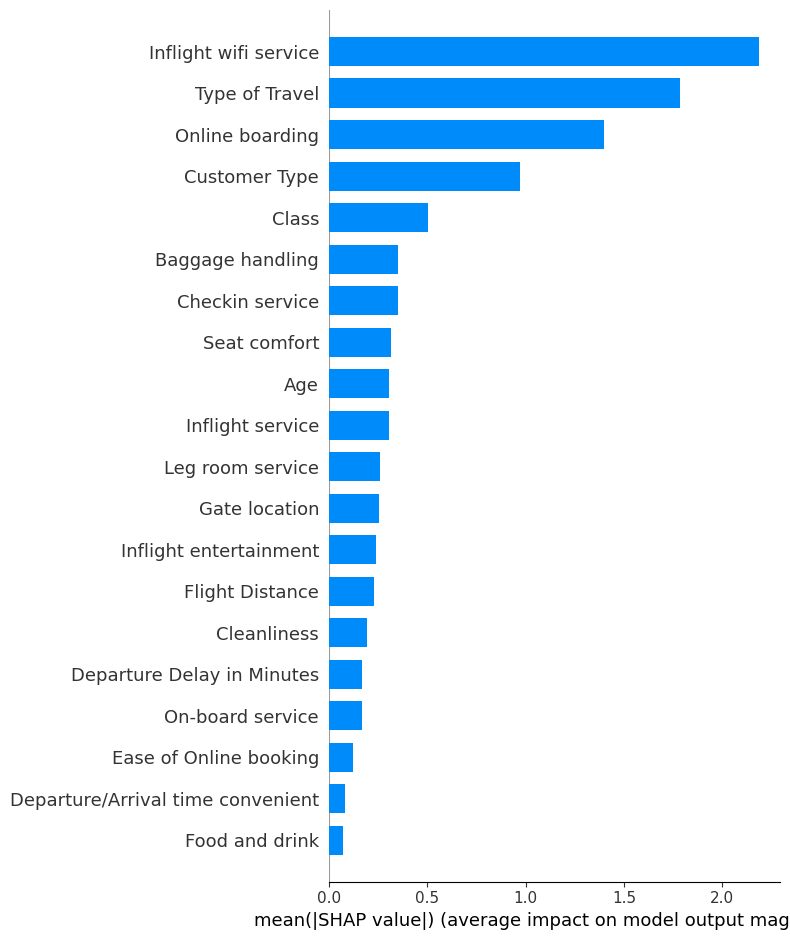

In [ ]:
# create SHAP Tree Explainer for XGBoost model with| first 1000 rows of train data
xgb_shap_values = shap.TreeExplainer(xgb_clf).shap_values(X_train[:1000])

# create SHAP summary plot with next 1000 rows of train data
shap.summary_plot(xgb_shap_values, X_train[1000:2000], plot_type='bar')

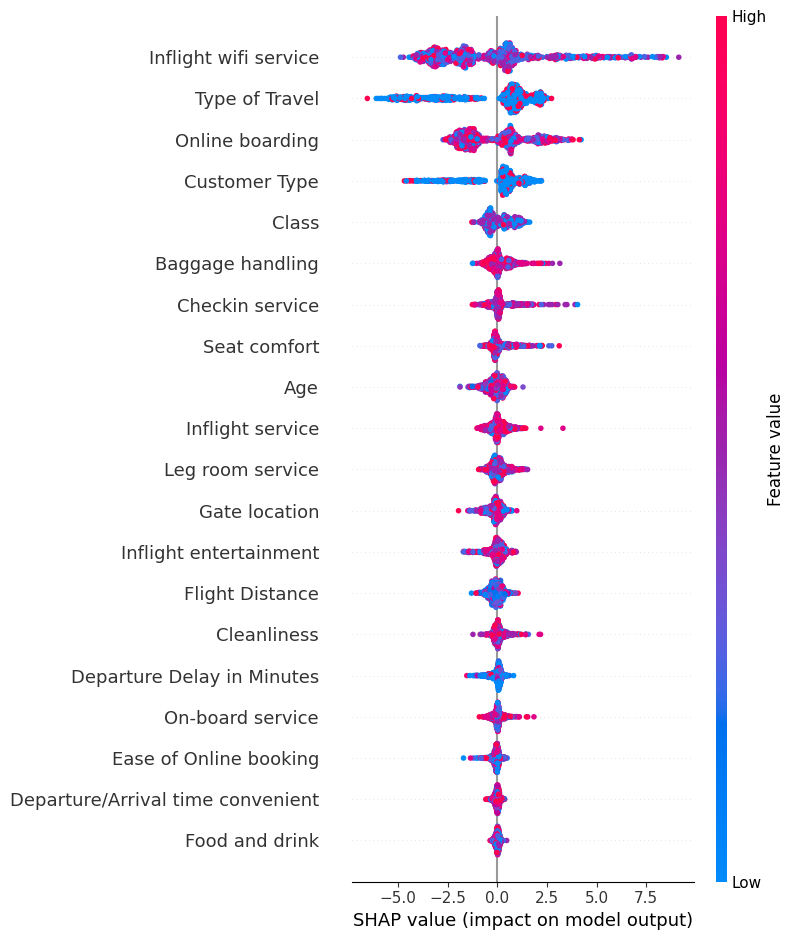

In [ ]:
# create SHAP summary plot to visualize impact distribution of next 1000 rows of train data
shap.summary_plot(xgb_shap_values, X_train[1000:2000])

### Random Forest

In [ ]:
# create SHAP Tree Explainer for Random Forest model with| first 1000 rows of train data
#rf_shap_values = shap.TreeExplainer(rf_clf).shap_values(X_train[:1000])

# create SHAP summary plot with next 1000 rows of train data
#shap.summary_plot(rf_shap_values, X_train[1000:2000], plot_type='bar')

In [ ]:
# create SHAP summary plot to visualize impact distribution of next 1000 rows of train data
#shap.summary_plot(rf_shap_values, X_train[1000:2000])

### LightGBM

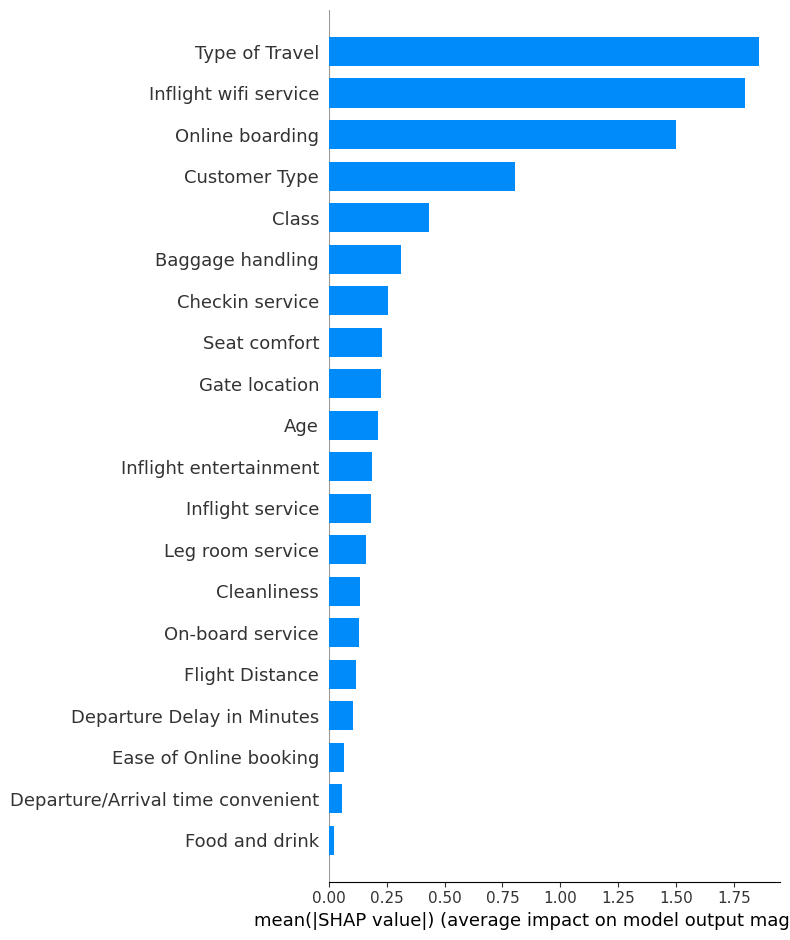

In [ ]:
# create SHAP Tree Explainer for LightGBM  model with| first 1000 rows of train data
lgbm_shap_values = shap.TreeExplainer(lgbm_clf).shap_values(X_train[:1000])

# create SHAP summary plot with next 1000 rows of train data
shap.summary_plot(lgbm_shap_values, X_train[1000:2000], plot_type='bar')

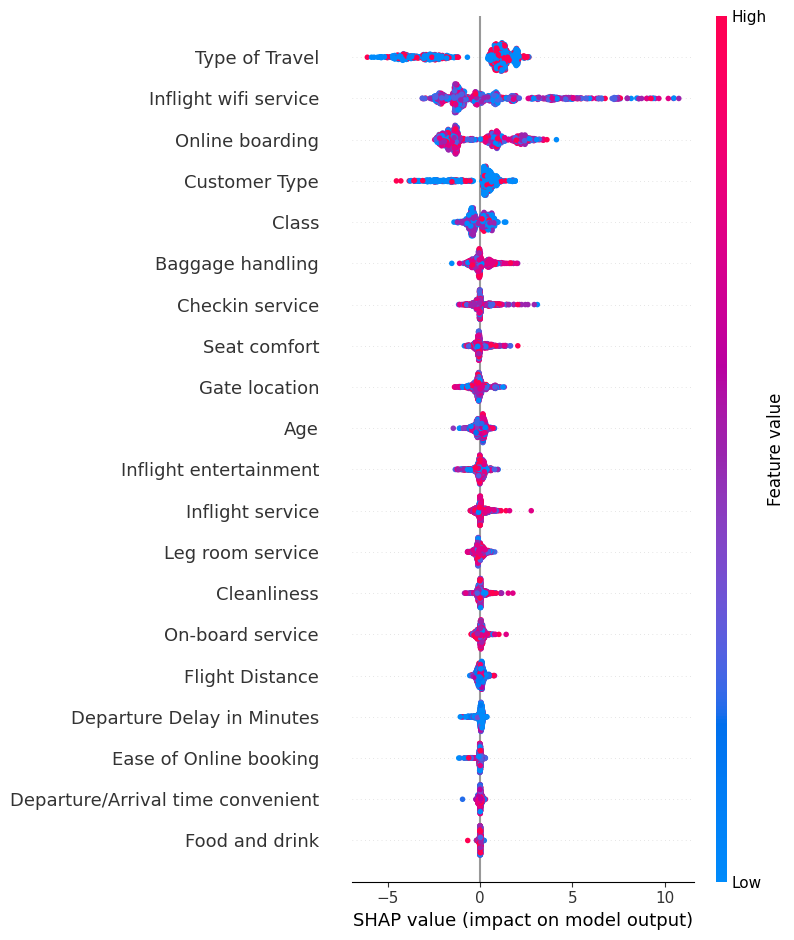

In [ ]:
# create SHAP summary plot to visualize impact distribution of next 1000 rows of train data
shap.summary_plot(lgbm_shap_values, X_train[1000:2000])

# SUMMARY and Recomendation



Pada kasus prediksi customer churn pada bank, matriks yang digunakan pada evaluasi adalah recall, F1 Score dan accuracy. Pelilihan matriks recall dikarenakan kita ingin mengidentifikaisi sebanyak mungkin customer yang benar-benar not satisfied untuk menangkap pola apa saja yang membuat mereka not satisfied, f1 score dipilih karena kita tidak hanya ingin hanya memfokuskan menangkap sebanyak mungkin customer yang churn secara aktual tapi jua ingin mengetahui performa model kita dalam memprediksi (matriks precision, hasil observasi prediksi) maka dari itu f1 score dibutuhkan untuk mengharmonisasi antara recall dan precission.

Model Light Gradient Boosting memiliki performa yang paling baik diantara logistic regression, random forest dan Extreme Gradient Boosting. Hal ini dibuktikan dengan clasification report pada data testing dengan nilai sebagai berikut:
- Accuracy = 96.31%
- Recall = 98.09%.
- F1-score = 96.83%
- precision = 95.61%
 Pada kelas 0 atau customer yang not satisfied. Karena kita ingin memfokuskan pada customer yang not satisfied.

Model yang bagus belum tentu memiliki reason yang kuat dapat menginterpretasikan model. Untuk dapat menginterpretasikan model, digunakan explainable ai untuk menjelaskan ensemble model seperi xgboost, lightgbm dan random forest. Model XAI yang digunakan adalah permutable feature importance, Partial dependance plot dan LIME.

Setelah dilakukan penjelasan model xgboost, random forest dan lightgbm dijelaskan menggunakan XAI. Model LIGHTGBM memiliki reason yang lebih baik dan dapat memberikan interpretasi yang lebih baik dibandingkan Random Forest dan XGboost.

- Hasil Interpretasi XAI menggunakan Permutable Feature importance
Model Random Forest memiliki 10 fitur sebagai feature impotant dengan drop loss diatas 0.002 pada setiap fitur penting.`inflight wifi service` dan `type of travel` memiliki pengaruh signifikan terhadap kepuasan pelanggan.<br>
Model LGBM 10 fitur sebagai feature impotant dengan drop loss diatas 0.002 pada setiap fitur penting.`inflight wifi service` dan `type of travel` memiliki pengaruh signifikan terhadap kepuasan pelanggan, besar drop loss dari kedua fitur ini lebih besar 2 kalinya dibadingkan random forest.<br>
Model XGBOOST 10 fitur sebagai feature impotant dengan drop loss diatas 0.002 pada setiap fitur penting.`inflight wifi service` dan `type of travel` memiliki pengaruh signifikan terhadap kepuasan pelanggan, besar drop loss dari kedua fitur ini lebih besar 2 kalinya dibadingkan random forest.<br>

- Hasil Interpretasi XAI menggunakan partial dependance
Fitur yang diperhitungkan hampir mirip. Namun pada model RANDOM FOREST, setiap keaikan nilai pada fitur memiliki pengaruh yang signifikan terhadap peluang customer not satisfied dan satisfied.

- Hasil Interpretasi XAI menggunakan LIME
Fitur yang mempengaruhi kelas not satisfied dan not satisfaid lebih reasonable pada model LIGHTGBM. Customer type 0 atau loyal cerderung akan satisfied, type of travel = 0 atau business travel cenderung akan satisfied dan memiliki nilai signifikansi yang cukup besar pada kedua fitur tersebut. Pada saat EDA, juga terlihat bahwa kedua fitur ini memiliki pegaruh yang cukup signifikan pada kepuasan pelanggan.Pada Setiap categorical atau rating yang diberikan pada setiap aspek, model LIGHTGBM memberikan batas yang cukup masuk akal, pemberian rating dibawah 3 atau 2 akan menyebabkan customer not satifsied.Model LGBM memberikan lebih banyak fitur yang menyebabkan customer unsatisfied tetapi tidak mempertimbangkan deparature delay in minutes.

Berdasarkan hasil XAI diatas, maka saya merekomendasikan untuk menggunakan model LIIGHTGBM pada prediksi customer satisfaction karena mempertimbangkan lebih banyak fitur yang menyebebkan customer tidak satisfied dan memiliki reason yang lebih logis dibandingkan random forest dan LGBM.


Interpretasi XAI LIGHTGBM:
- `Customer type` = 0 atau customer yang loyal memiliki peluang yang tinggi untuk satisfied. Sedangkan `Customer type` = 1 atau customer yang tidak loyal memiliki peluangkan yang sangat besar untuk not satisfied. Fitur ini memiliki pengarung yang sangat signifikan terhadap kepuasan customer
- `Type of travel` = 0 atau customer yang business travel memiliki peluang yang tinggi untuk satisfied. Sedangkan `Customer type` = 1 atau customer yang personal travel memiliki peluangkan yang sangat besar untuk not satisfied. Fitur ini memiliki pengarung yang sangat signifikan terhadap kepuasan customer
- Customer yang memberikan rating `inflight wifi service` <= 2, maka akan not satisfied.
- Customer yang memberikan rating `Online boarding` <= 2, maka akan not satisfied
- Customer yang memberikan rating `Leg Room rervice` <= 4, maka akan not satisfied
- Customer yang memberikan rating `Cleaniness` <= 2, maka akan not satisfied
- Customer yang memberikan rating `Baggage handling` <= 3, maka akan not satisfied
- Customer yang memberikan rating `inflight service` <= 3, maka akan not satisfied.
- Customer yang memberikan rating `Gate location` <= 2, maka akan not satisfied

# Business Recomendation


1. Segmentasi Pelanggan Berdasarkan Tipe dan Strategi Peningkatan Loyalitas
Insight:

Pelanggan loyal memiliki peluang tinggi untuk puas, sedangkan pelanggan tidak loyal cenderung tidak puas.
Rekomendasi:

Program Loyalitas: Tingkatkan upaya untuk mempertahankan pelanggan setia melalui program loyalitas, seperti penawaran khusus, akses prioritas, atau diskon eksklusif.
Retensi Pelanggan Baru: Identifikasi pelanggan tidak loyal dan implementasikan program onboarding yang lebih baik, seperti penawaran untuk perjalanan pertama, edukasi manfaat, atau pemberian voucher.
2. Fokus pada Pelanggan Perjalanan Bisnis (Business Travel)
Insight:

Pelanggan perjalanan bisnis cenderung lebih puas dibandingkan pelanggan perjalanan pribadi.
Rekomendasi:

Layanan Premium: Tingkatkan layanan premium bagi pelanggan bisnis, seperti fasilitas ruang tunggu, layanan penjadwalan ulang cepat, atau akses internet berkecepatan tinggi di pesawat.
Personalisasi untuk Pelancong Pribadi: Identifikasi kebutuhan unik pelanggan personal travel untuk meningkatkan pengalaman, misalnya dengan hiburan tambahan, promosi destinasi wisata, atau paket keluarga.
3. Perbaikan Layanan Utama Berdasarkan Aspek yang Memengaruhi Ketidakpuasan
Insight:

Rating rendah pada aspek seperti inflight wifi, online boarding, leg room, cleaniness, baggage handling, inflight service, dan gate location berkontribusi besar terhadap ketidakpuasan.
Rekomendasi:

Inflight Wifi Service: Tingkatkan kecepatan dan stabilitas layanan wifi di pesawat dengan investasi infrastruktur teknologi.
Online Boarding: Optimalkan pengalaman boarding online, misalnya melalui antarmuka aplikasi yang lebih ramah pengguna dan integrasi informasi penerbangan yang lebih jelas.
Leg Room: Tambahkan opsi kursi dengan ruang kaki lebih luas untuk pelanggan dengan biaya tambahan minimal.
Cleanliness: Tingkatkan standar kebersihan pesawat dengan pemeriksaan lebih sering sebelum keberangkatan.
Baggage Handling: Kurangi keluhan terkait penanganan bagasi dengan mempercepat proses dan meningkatkan komunikasi status bagasi melalui aplikasi.
Gate Location: Permudah akses ke lokasi gerbang keberangkatan dengan penunjuk arah yang lebih jelas dan transportasi bandara internal (misalnya shuttle).
4. Penanganan Keterlambatan Keberangkatan (Departure Delay)
Insight:

Pelanggan cenderung tidak puas jika mengalami keterlambatan keberangkatan.
Rekomendasi:

Prediksi dan Pencegahan Delay: Gunakan model prediksi untuk mengantisipasi potensi keterlambatan dan lakukan mitigasi, seperti penyesuaian jadwal atau perencanaan lebih baik.
Komunikasi Proaktif: Informasikan keterlambatan kepada pelanggan sedini mungkin dan tawarkan kompensasi seperti akses ruang tunggu atau voucher makanan.
5. Program Peningkatan Feedback Positif
Insight:

Pelanggan memberikan rating rendah untuk berbagai layanan jika tidak puas.
Rekomendasi:

Survei Post-flight: Tingkatkan proses pengumpulan feedback setelah penerbangan dengan insentif untuk partisipasi, seperti poin reward.
Quick Wins: Fokus pada perbaikan area yang mendapat rating rendah dalam survei sebelumnya untuk menghasilkan dampak langsung pada kepuasan pelanggan.
6. Kampanye Edukasi dan Branding
Insight:

Faktor seperti kebersihan, layanan inflight, dan online boarding sangat berpengaruh pada persepsi pelanggan.
Rekomendasi:

Branding pada Aspek Kualitas: Jadikan kebersihan, kenyamanan, dan teknologi modern sebagai bagian dari kampanye pemasaran untuk meningkatkan kepercayaan pelanggan terhadap maskapai.
Komunikasi Keunggulan: Soroti peningkatan layanan yang telah dilakukan untuk menunjukkan bahwa maskapai mendengarkan umpan balik pelanggan.